# Initalize libraries

## Import libraries

In [1]:
# general
import sys, os
import time
from os.path import join
from os import path
from importlib import reload
from getpass import getuser
from glob import glob
from tqdm.auto import tqdm
from multiprocessing import Pool
import json

# Data
import xarray as xr
import h5py
import numpy as np
import imageio
from PIL import Image

# Plotting
import matplotlib.pyplot as plt

from nexusformat.nexus import *

# skimage
import skimage.morphology
from skimage.draw import ellipse

# scipy
from scipy.ndimage import gaussian_filter
from scipy import stats
import scipy

# pyFAI
import pyFAI
from pyFAI.azimuthalIntegrator import AzimuthalIntegrator
from pyFAI.detectors import Detector

# Self-written libraries
sys.path.append(join(os.getcwd(), "library"))
import fthcore as fth
import helper_functions as helper
import mask_lib
import interactive
from interactive import cimshow
import reconstruct_rb as rec
import reconstruct as reco

# Facility specific loading functions
import MAXI_loading as loading

plt.rcParams["figure.constrained_layout.use"] = True  # replaces plt.tight_layout

  File "<frozen runpy>", line 203, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/home/riccardo/miniforge3/envs/myenv/lib/python3.13/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/home/riccardo/miniforge3/envs/myenv/lib/python3.13/site-packages/traitlets/config/application.py", line 1075, in launch_instance
    app.start()
  File "/home/riccardo/miniforge3/envs/myenv/lib/python3.13/site-packages/ipykernel/kernelapp.py", line 758, in start
    self.io_loop.start()
  File "/home/riccardo/miniforge3/envs/myenv/lib/python3.13/site-packages/tornado/platform/asyncio.py", line 211, in start
    self.asyncio_loop.run_forever()
  File "/home/riccardo/miniforge3/envs/myenv/lib/python3.13/asyncio/base_events.py", line 683, in run_forever
    self._run_once()
  File "/home/riccardo/miniforge3/envs/myenv/lib/python3.13/asyncio/base_events.py", line 2060, in _run_once
    handle._run()
  File "/home/riccardo/miniforge

GPU available


In [2]:
# Is there a GPU?
try:
    # Cupy
    import cupy as cp
    import cupyx as cpx

    GPU = True

    print("GPU available")

    # Self-written library
    import CCI_core_cupy as cci
    import Phase_Retrieval as PhR
    import Phase_Retrieval_2ndharm as PhR2
    
except:
    GPU = False
    import CCI_core as cci


GPU available


In [3]:
# interactive plotting
import ipywidgets

%matplotlib widget

# Auto formatting of cells
#%load_ext jupyter_black


## Experiment specific Functions

In [4]:
PROPOSAL = 20241001
USER = "ck"

BASEFOLDER = r"/media/riccardo/EXT_16TB1/DATA/MAXIV/MaxIV2409"
DATAFOLDER = r"/media/riccardo/EXT_16TB1/DATA/MAXIV/MaxIV2409/raw"
CMOSFOLDER = r"/media/riccardo/EXT_16TB1/DATA/MAXIV/MaxIV2409/proc"
USERFOLDER = path.join(BASEFOLDER, USER)
SCANFILE = "2409_maxiv_{scanid:05d}.h5"

# Load mnemonics for easy data handling
mnemonics = loading.mnemonics

### Loading data

In [5]:
def generate_filename(scan_nr: int):
    """
    Generates filename of the given scan id
    
    Parameter
    =========
    scan_nr : number identifier (id) of the given scan
        
    Output
    ======
    filename : str
        full generated filename
    ======
    author: ck 2024
    """
    return join(DATAFOLDER, SCANFILE.format(scanid=scan_nr))

def load_data(scan_id, keypath = mnemonics["pre_scan_snapshot"], keys = None):
    """
    Load data of all specified keys from keypath
    
    Parameter
    =========
    scan_id : int
        experimental identifier of scan
    keypath : str
        path of nexus file tree to relevant data field
    keys : str or list of strings
        keys to load from keypath
        
    Output
    ======
    data : dict
        data dictionary of keys
    ======
    author: ck 2024
    """
        
    #Generate filename from scan_id
    fname = generate_filename(scan_id)
    
    # load data with basic loading function
    data = loading.load_data(fname, keypath, keys = keys)
    
    return data


def load_key(scan_id, key):
    """
    Load any kind of data specified by key (path)
    
    Parameter
    =========
    scan_id : int
        experimental identifier of scan
    key : str
        key path of nexus file tree to relevant data field
   
    Output
    ======
    data : dict
        data dictionaray on single key
    ======
    author: ck 2024
    """
    #Generate filename from scan_id
    fname = generate_filename(scan_id)
    
    # load data with basic loading function
    data = loading.load_key(fname, key)
    
    return data

### Loading images

In [6]:
def get_filepath(tiffname, camera_type = "cmos"):
    """Return raw data path from save file path."""
    head, tifffile = path.split(tiffname)
    head, scandir = path.split(head)
    return path.join(BASEFOLDER,"data","raw", camera_type, scandir, tifffile)

def get_cmos_avgfile(scanid):
    return path.join(CMOSFOLDER, f"scan_{scanid:04d}_avg.h5")

def load_tiff(tifffile):
    """load single tiff image into np array"""
    return np.array(Image.open(tifffile))

def load_tiff_list(filelist, processes=None):
    """Multiprocessing loading of image files"""
    with Pool(processes=processes) as pool:
        frames = pool.map(load_tiff, filelist)
    return np.stack(frames)

def load_cmos(scanid):
    # Load averaged image if it does exist
    fname = get_cmos_avgfile(scanid)
    #print("Loading: %s" % fname)
    with h5py.File(fname, "r") as f:
        image = f["image"][()].squeeze()
    return image

def load_images(im_id, single_frames=False):
    """
    Loads images for a given scan id
    
    Parameter
    =========
    im_id : int
        experimental identifier of image scan
   
    Output
    ======
    images : array
        stack of all images the correspond to the id
    ======
    author: ck 2024
    """
    scanfile = generate_filename(im_id)
    data = nxload(scanfile)[f"entry{im_id}/measurement"]
    
    if "ccd" in data:
        # Find spe files
        spe_file_list = list(data["ccd"])
        
        # Loop over image spe files
        # TODO: fix filenames for windows PC
        images = []
        for spe_file in spe_file_list:
            images.append(np.squeeze(np.array(imageio.mimread(spe_file, memtest="5000MB"))))

        # Stack to 3d array
        images = np.stack(images)
    elif "cmos" in data:
        images = load_cmos(im_id)
    else:
        raise ValueError(f"No known image data in {scanfile}.")

    return images

#Draw circle mask
def circle_mask(shape,center,radius,sigma='none'):

    '''
    Draws circle mask with option to apply gaussian filter for smoothing
    
    Parameter
    =========
    shape : int tuple
        shape/dimension of output array
    center : int tuple
        center coordinates (ycenter,xcenter)
    radius : scalar
        radius of mask in px. Care: diameter is always (2*radius+1) px
    sigma : scalar
        std of gaussian filter
        
    Output
    ======
    mask: array
        binary mask, or smoothed binary mask        
    ======
    author: ck 2022
    '''
    
    #setup array
    x = np.linspace(0,shape[1]-1,shape[1])
    y = np.linspace(0,shape[0]-1,shape[0])
    X,Y = np.meshgrid(x,y)

    # define circle
    mask = np.sqrt(((X-center[1])**2+(Y-center[0])**2)) <= (radius)
    mask = mask.astype(float)

    # smooth aperture
    if sigma != 'none':
        mask = gaussian_filter(mask,sigma)
           
    return mask

### Loading image procedure

In [7]:
# Full image loading procedure
def load_processing(im_id, crop=None):
    """
    Loads images, averaging of two individual images (scans in tango consist of two images),
    padding to square shape, Additional cropping (optional)
    """

    if isinstance(im_id,list):
        images = []
        for idx in im_id:
            images.append(load_images(idx))

        images = np.stack(images)
    else:
        # Load data
        images = load_images(im_id)

    # Zeropad to get square shape
    #images = helper.padding(images)

    # Calculate mean
    if images.ndim > 2:
        image = np.mean(images, axis=0)
    else:
        image = images.copy()

    # Optional cropping
    if crop is not None:
        images = images[:, :crop, :crop]
        image = image[:crop, :crop]

    return image, images

binning=4
def bin_im(im):
    im2=im[::binning, ::binning]*0
    for i in range(binning):
        for j in range(binning):
            try:
                im2+=im[i::binning, j::binning]
            except:
                pass
    return im2


### Loading, saving fth & cdi data

In [8]:
# Saving of log files for fth and cdi recos
def save_fth_h5():
    # Save h5
    data = {}
    data["im_id"] = im_id
    data["topo_id"] = topo_id
    data["topo_centered"] = topo_c
    data["im_centered"] = im_c
    data["holo"] = holo
    data["recon"] = recon
    data["factor"] = factor
    data["offset"] = offset
    data["center"] = center
    data["roi"] = roi
    data["prop_dist"] = prop_dist
    data["phase"] = phase
    data["mask_bs"] = mask_pixel_smooth
    data["bs_smoothing"] = bs_smoothing
    data["experimental_setup"] = experimental_setup

    filename = join(
        folder_general, "Logs", "Data_ImId_%s_RefId_%s_%s" % (im_id, topo_id, USER)
    )
    print("Now Saving: %s" % filename)
    cci.create_hdf5(data, filename)


def save_cdi_h5():
    # Save h5
    data = {}
    data["im_id"] = im_id
    data["topo_id"] = topo_id
    data["pos"] = pos
    data["neg"] = neg
    data["factor"] = factor
    data["offset"] = offset
    data["center"] = center
    data["roi"] = roi
    data["prop_dist"] = prop_dist_cdi
    data["phase"] = phase_cdi
    data["mask_bs"] = mask_bs_cdi
    data["supportmask"] = supportmask
    data["mask_pixel"] = mask_pixel
    data["p_pc"] = p_pc
    data["n_pc"] = n_pc
    data["experimental_setup"] = experimental_setup

    filename = join(
        folder_general,
        "Logs",
        "Data_ImId_%s_RefId_%s_cdi_%s" % (im_id, topo_id, USER),
    )
    print("Now Saving: %s" % filename)
    cci.create_hdf5(data, filename)
    return


def save_topo_holo(topo_c, pos_id, neg_id):
    """
    Save only topo holos which can be later used for single helicity reconstructions
    """
    data = {}
    data["pos_id"] = pos_id
    data["neg_id"] = neg_id
    data["topo"] = topo_c

    filename = join(
        folder_general,
        "Topos",
        "Topo_ImId_%s_RefId_%s_cdi_%s" % (pos_id, neg_id, USER),
    )
    print("Now Saving: %s" % filename)
    cci.create_hdf5(data, filename)
    return

def load_fth(im_id, topo_id):
    """
    Load fth dataset
    """
    fname = join(
        folder_target,
        "Logs",
        "Data_ImId_%s_RefId_%s_%s.hdf5"
        % (
            im_id,
            topo_id,
            USER,
        ),
    )

    with h5py.File(fname, "r") as f:
        data = {}
        for key in f.keys():
            if key != "experimental_setup":
                data[key] = f[key][()]

    return data

def load_topo_holo(pos_id, neg_id):
    """
    Load topo holos for single helicity reconstructions
    """
    fname = join(
        folder_general,
        "Topos",
        "Topo_ImId_%s_RefId_%s_cdi_%s.hdf5" % (pos_id, neg_id, USER),
    )

    with h5py.File(fname, "r") as f:
        im_out = f["topo"][()]
    return im_out


def load_cdi(im_id, topo_id):
    """
    Load cdi dataset
    """
    fname = join(
        folder_general,
        "Logs",
        "Data_ImId_%s_RefId_%s_cdi_%s.hdf5" % (im_id, topo_id, USER),
    )

    with h5py.File(fname, "r") as f:
        data = {}
        for key in f.keys():
            if key != "experimental_setup":
                data[key] = f[key][()]
    return data_cdi

def load_parameter_dict(fname: str) -> dict:
    """Read support mask definition from json file."""
    with open(fname, 'r') as f:
        support_dict = json.loads(f.read())
    return support_dict

def save_parameter_dict(support_dict: dict, fname: str, update=True) -> None:
    """Write support mask definition to json file.
    
    Only updates/adds entries if update=True (default),
    otherwise overwrites file and discards existing entries.
    """
    if update and path.exists(fname):
        support_dict_disk = load_parameter_dict(fname)
        support_dict_disk.update(support_dict)
    else:
        support_dict_disk = support_dict
    with open(fname, 'w') as f:
        f.write(json.dumps(support_dict_disk, indent=2))

### Other

In [9]:
def adjust_wave(ar, ratio):
    """
    Function to zoom in and out of array without changing its size
    """
    size = ar.shape
    old_x = np.linspace(-size[0] / 2, size[0] / 2, size[0])
    old_y = np.linspace(-size[1] / 2, size[1] / 2, size[1])
    new_x = old_x * ratio
    new_y = old_y * ratio
    res_func = scipy.interpolate.RectBivariateSpline(old_x, old_y, ar, kx=1, ky=1)
    return res_func(new_x, new_y)

In [10]:
def differential_operator(shape,center, experimental_setup, angle = 0):
    '''
    Calculates Fourier-space differential operator for heraldo reconstruction
    
    Parameter
    ---------
    shape: int tuple
        shape of output array
    center: tuple
        array center coordinates (y,x) 
    experimental_setup: dict
        must contain detector pixel_size ["px_size"], distance ["ccd_dist"],
        wavelength ["lambda"]
    angle: float
        rotation angle of heraldo slit
        
    Returns:
    --------
    return: complex array
        differential operator in Fourier space
    '''
    
    # Convert deg to rad
    angle = np.deg2rad(angle)
    
    # Create x,y grid to convert pixel in q-space
    x, y = np.meshgrid(np.arange(shape[0]),np.arange(shape[0]))
    
    # Center meshgrid
    y, x = y - center[0],  x - center[1]
    
    # Multiplay with pixel size
    y, x = y*experimental_setup["px_size"], x*experimental_setup["px_size"]
    
    # Convert to q-space
    qy = 4*np.pi/experimental_setup["lambda"] * np.sin(0.5*np.arctan(y/experimental_setup["ccd_dist"]))
    qx = 4*np.pi/experimental_setup["lambda"] * np.sin(0.5*np.arctan(x/experimental_setup["ccd_dist"]))
    
    # Normalize q space to [-1,1]
    qy, qx = qy/np.max(np.abs(qy)), qx/np.max(np.abs(qx))
    
    return 2j*np.pi*qx*np.cos(angle) + 2j*np.pi*qy*np.sin(angle)

In [11]:
def reconstruct_heraldo(holo, experimental_setup, center = None, prop_dist = 0, phase = 0,angle = 0):
    '''
    Reconstruction of holograms in heraldo reference scheme
    
    Parameter:
    ----------
    holo: array
        Centered input hologram
    experimental_setup: dict
        must contain detector pixel_size ["px_size"], distance ["ccd_dist"],
        wavelength ["lambda"]
    center: tuple or None
        array center coordinates (y,x) 
    prop_dist: float
        propagation distance
    phase: float
        global phase shift of complex array
    angle: float
        rotation angle of heraldo slit in deg
        
    returns:
    image: array
        reconstructed image
    heraldo_operator: complex array
        differential operator in Fourier space
    '''
    
    if center is None:
        center = np.array(holo.shape)/2
    
    heraldo_operator = differential_operator(holo.shape,center, 
                    experimental_setup, angle = angle)
    holo = holo * heraldo_operator
    holo = fth.propagate(holo, prop_dist*1e-6, experimental_setup = experimental_setup)*np.exp(1j*phase)
    image = fth.reconstruct(holo)
    
    return image, heraldo_operator

In [12]:
# Worker which performs complete fth reconstruction process
def worker(image, topo):
    # Centering
    shift_c = np.array(topo.shape) / 2 - center
    topo_c = cci.shift_image(topo, shift_c)
    im_c = cci.shift_image(image, shift_c)
    
    ## Image registration
    #shift = cci.image_registration(
    #    im_c[roi_im_reg],
    #    topo_c[roi_im_reg],
    #    method="dipy",
    #)
    shift = [0,0]
    print("Relative shift is: %s"%shift)

    
    # Correct relative drift
    topo_c = cci.shift_image(topo_c, shift) 
    
    # Optional ewalds sphere projection
    if project_ewalds_sphere is True:
        %%time
        proj_im = PhR.inv_gnomonic2(im_c,alpha=experimental_setup["angle"], center=None, experimental_setup = experimental_setup, method='cubic' , mask=None)
        proj_topo = PhR.inv_gnomonic2(topo_c,alpha=experimental_setup["angle"], center=None, experimental_setup = experimental_setup, method='cubic' , mask=None)

        im_c = proj_im.copy()
        topo_c = proj_topo.copy()

    # Create masks
    # Load polygon mask and shift to manually determined position
    mask = mask_lib.load_poly_masks(
    experimental_setup["binning"] * np.array(image.shape),
    polymasks,
    polygon_names,
)
    mask = np.round(cci.shift_image(mask,mask_shift))
    #mask = np.zeros(topo_c)
    
    # Increase/Decrease mask size
    #footprint = skimage.morphology.disk(np.abs(mask_scale))
    #if mask_scale > 0:
    #    mask = skimage.morphology.dilation(mask, footprint) # increase size
    #elif mask_scale < 0: 
    #    mask = skimage.morphology.erosion(mask, footprint) # decrease size

    # Create image specific beamstop mask
    mask_im = mask.copy()
    mask_im = mask_im + (im_c > experimental_setup["oversaturation"])
    mask_im[mask_im > 1] = 1

    # Create topo specific beamstop mask
    mask_topo = mask.copy()
    mask_topo = mask_topo + (topo_c > experimental_setup["oversaturation"])

    # Combine both
    mask_pixel = mask_im + mask_topo
    mask_pixel[mask_pixel > 1] = 1
    
    # Create smooth mask
    footprint = skimage.morphology.disk(4)
    mask_pixel_smooth = skimage.morphology.dilation(mask_pixel, footprint)
    mask_pixel_smooth = gaussian_filter(mask_pixel_smooth, 2)

    # Get scaling factor and offset
    factor, offset = cci.dyn_factor(
        im_c * (1 - mask_pixel),
        topo_c * (1 - mask_pixel),
        method="correlation",
        verbose=False,
        plot=False,
    )

    # Calculate differences (magnetic) and sums (topographc) contrast holograms.
    # _c: centered, without beamstop, _b: centered, with beamstop
    diff_c = im_c / factor - topo_c - offset
    sum_c = im_c / factor + topo_c - offset

    if heraldo is True:
        #holo = sum_c * heraldo_operator * mask_bs*(1 - mask_pixel_smooth)
        holo = diff_c * heraldo_operator * (1 - mask_pixel_smooth)
    elif heraldo is False:
        #holo = sum_c * mask_bs*(1 - mask_pixel_smooth)
        holo = diff_c * (1 - mask_pixel_smooth)

    # Reconstruct
    recon = cci.reconstruct(
        fth.propagate(holo, prop_dist * 1e-6, experimental_setup=experimental_setup)
        * np.exp(1j * phase)
    )

    # worker dictionary
    worker_dict = {}
    worker_dict["center"] = center
    worker_dict["topo_c"] = topo_c
    worker_dict["im_c"] = im_c
    worker_dict["recon"] = recon
    worker_dict["factor"] = factor
    worker_dict["offset"] = offset
    worker_dict["shift"] = shift
    worker_dict["diff_c"] = diff_c
    worker_dict["sum_c"] = sum_c
    worker_dict["mask_bs"] = mask_pixel_smooth
    worker_dict["mask_pixel"] = mask_pixel
    
    return worker_dict

In [13]:
# Setup phase and propagation for cdi once
phase_cdi = 0
prop_dist_cdi = 0
dx = 0
dy = 0


def phase_retrieval(
    pos, neg, mask_pixel, supportmask, vmin = 0, Startimage=None, Startgamma=None
):
    # Prepare Input holograms
    pos2 = pos.copy()
    neg2 = neg.copy()

    #mi, _ = np.percentile(pos2[pos2 != 0], [vmin, 99.9])
    #pos2 = pos2 - mi
    #mi, _ = np.percentile(neg2[neg2 != 0], [vmin, 99.9])
    #neg2 = neg2 - mi

    print("no offset subtraction")
    
    pos2[pos2 < 0] = 0
    neg2[neg2 < 0] = 0
    pos2 = pos2.astype(complex)
    neg2 = neg2.astype(complex)

    bsmask_p = mask_pixel.copy()
    bsmask_p[pos2 <= 0] = 1
    bsmask_n = mask_pixel.copy()
    bsmask_n[neg2 <= 0] = 1

    # Setup start image and startgamma
    if Startimage is None:
        Startimage = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(supportmask)))
    else:
        Startimage = Startimage.copy()
    if Startgamma is None:
        Startgamma = np.ones(pos.shape) * 1e-6 * 2
        Startgamma[pos.shape[0] // 2, pos.shape[1] // 2] = 0.7
    else:
        Startgamma = Startgamma.copy()

    # Settings for phase retrieval reconstructions
    partial_coherence = True

    # Setup
    retrieved_p = np.zeros(pos2.shape, np.cdouble)
    retrieved_n = np.zeros(pos2.shape, np.cdouble)

    # Algorithms and Inital guess
    plt.rcParams["figure.dpi"] = 100
    print("CDI - larger mask")

    algorithm_list = ["mine", "mine", "mine"]
    Nit_list = [700, 50, 50]  # iterations for algorithm_list

    x = (np.sqrt(np.maximum(pos2, np.zeros(pos2.shape)))[mask_pixel == 0]).flatten()
    y = ((np.abs(Startimage))[mask_pixel == 0]).flatten()
    res = stats.linregress(x, y)
    Startimage -= res.intercept
    Startimage /= res.slope

    average_img = 30
    real_object = False  # always set to False

    if partial_coherence:
        RL_freq = 20
        RL_it = 50

        algorithm_list_pc = ["mine", "ER", "ER"]
        Nit_list_pc = [700, 50, 50]

    # Execute Phase retrieval
    start_time = time.time()
    for i in range(len(Nit_list) // 3):
        print("############ -   CDI")

        # Positive helicity - beta_mode="arctan"
        retrieved_p, Error_diff_p, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i],
            beta_zero=0.5,
            Nit=Nit_list[3 * i],
            beta_mode="arctan",
            plot_every=349,
            Phase=Startimage,
            seed=False,
            real_object=real_object,
            bsmask=bsmask_p,
            average_img=average_img,
            Fourier_last=True,
        )

        # Positive helicity - beta_mode="const"
        retrieved_p, Error_diff_p2, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i + 1],
            beta_zero=0.5,
            Nit=Nit_list[3 * i + 1],
            beta_mode="const",
            plot_every=24,
            Phase=retrieved_p,
            seed=False,
            real_object=real_object,
            bsmask=bsmask_p,
            average_img=average_img,
            Fourier_last=True,
        )

        # Negative helicity - beta_mode="arctan"
        retrieved_n, Error_diff_n2, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(neg2, np.zeros(neg2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i + 2],
            beta_zero=0.5,
            Nit=Nit_list[3 * i + 2],
            beta_mode="const",
            plot_every=24,
            Phase=retrieved_p * np.sqrt(np.sum(neg2) / np.sum(pos2)),
            seed=False,
            real_object=real_object,
            bsmask=bsmask_n,
            average_img=average_img,
            Fourier_last=True,
        )

        print("--- %s seconds ---" % np.round((time.time() - start_time), 2))

        Startimage = retrieved_p.copy()

        # Partial coherence phase retrieval
        if partial_coherence:
            # CDI_PC
            print("############   -   CDI_pc")
            pos3 = (np.abs(retrieved_p) ** 2) * bsmask_p + np.maximum(
                pos2, np.zeros(pos2.shape)
            ) * (1 - bsmask_p)
            neg3 = (np.abs(retrieved_n) ** 2) * bsmask_n + np.maximum(
                neg2, np.zeros(neg2.shape)
            ) * (1 - bsmask_n)

            # retrieve pos image
            (
                retrieved_p_pc,
                Error_diff_p_pc,
                Error_supp,
                gamma_p,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(pos3),
                mask=supportmask,
                mode=algorithm_list_pc[3 * i],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i],
                beta_mode="arctan",
                gamma=Startgamma,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=349,
                Phase=Startimage,
                seed=False,
                real_object=False,
                bsmask=np.zeros(bsmask_p.shape),
                average_img=average_img,
                Fourier_last=True,
            )

            (
                retrieved_p_pc,
                Error_diff_p_pc2,
                Error_supp,
                gamma_p,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(pos3),
                mask=supportmask,
                mode=algorithm_list[3 * i + 1],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i + 1],
                beta_mode="const",
                gamma=gamma_p,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=24,
                Phase=retrieved_p_pc,
                real_object=False,
                bsmask=np.zeros(bsmask_p.shape),
                average_img=average_img,
                Fourier_last=True,
            )
            (
                retrieved_n_pc,
                Error_diff_n_pc2,
                Error_supp,
                gamma_n,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(neg3),
                mask=supportmask,
                mode=algorithm_list[3 * i + 2],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i + 2],
                beta_mode="const",
                gamma=gamma_p,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=24,
                Phase=retrieved_p_pc * np.sqrt(np.sum(neg2) / np.sum(pos2)),
                real_object=False,
                bsmask=np.zeros(bsmask_n.shape),
                average_img=average_img,
                Fourier_last=True,
            )

            print("--- %s seconds ---" % np.round((time.time() - start_time), 2))

            Startimage = retrieved_p_pc.copy()
            Startgamma = gamma_p.copy()

    print("Phase Retrieval Done!")

    return (
        retrieved_p,
        retrieved_n,
        retrieved_p_pc,
        retrieved_n_pc,
        bsmask_p,
        bsmask_n,
        gamma_p,
        gamma_n,
    )





def phase_retrieval3(
    pos, neg, mask_pixel, supportmask, vmin = 0, Startimage=None, Startgamma=None
):
    # Prepare Input holograms
    pos2 = pos.copy()
    neg2 = neg.copy()

    #mi, _ = np.percentile(pos2[pos2 != 0], [vmin, 99.9])
    #pos2 = pos2 - mi
    #mi, _ = np.percentile(neg2[neg2 != 0], [vmin, 99.9])
    #neg2 = neg2 - mi

    print("no offset subtraction")
    
    pos2[pos2 < 0] = 0
    neg2[neg2 < 0] = 0
    pos2 = pos2.astype(complex)
    neg2 = neg2.astype(complex)

    bsmask_p = mask_pixel.copy()
    bsmask_p[pos2 <= 0] = 1
    bsmask_n = mask_pixel.copy()
    bsmask_n[neg2 <= 0] = 1


    if Startgamma is None:
        Startgamma = np.ones(pos.shape) * 1e-6 * 2
        Startgamma[pos.shape[0] // 2, pos.shape[1] // 2] = 0.7
    else:
        Startgamma = Startgamma.copy()

    # Settings for phase retrieval reconstructions
    partial_coherence = True


    # Algorithms and Inital guess
    plt.rcParams["figure.dpi"] = 100
    print("CDI - larger mask")

    algorithm_list = ["mine", "mine", "mine"]
    Nit_list = [700, 50, 50]  # iterations for algorithm_list

    x = (np.sqrt(np.maximum(pos2, np.zeros(pos2.shape)))[mask_pixel == 0]).flatten()
    y = ((np.abs(Startimage))[mask_pixel == 0]).flatten()
    res = stats.linregress(x, y)
    Startimage -= res.intercept
    Startimage /= res.slope

    average_img = 30
    real_object = False  # always set to False

    if partial_coherence:
        RL_freq = 20
        RL_it = 50

        algorithm_list_pc = ["mine", "ER", "ER"]
        Nit_list_pc = [700, 50, 50]

    # Execute Phase retrieval
    start_time = time.time()
    for i in range(len(Nit_list) // 3):
        print("############ -   CDI")

        # Positive helicity - beta_mode="const"
        retrieved_p, Error_diff_p2, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i + 1],
            beta_zero=0.5,
            Nit=Nit_list[3 * i + 1],
            beta_mode="const",
            plot_every=24,
            Phase=retrieved_p,
            seed=False,
            real_object=real_object,
            bsmask=bsmask_p,
            average_img=average_img,
            Fourier_last=True,
        )

        # Negative helicity - beta_mode="arctan"
        retrieved_n, Error_diff_n2, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(neg2, np.zeros(neg2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i + 2],
            beta_zero=0.5,
            Nit=Nit_list[3 * i + 2],
            beta_mode="const",
            plot_every=24,
            Phase=retrieved_p * np.sqrt(np.sum(neg2) / np.sum(pos2)),
            seed=False,
            real_object=real_object,
            bsmask=bsmask_n,
            average_img=average_img,
            Fourier_last=True,
        )

        print("--- %s seconds ---" % np.round((time.time() - start_time), 2))

        Startimage = retrieved_p.copy()

        # Partial coherence phase retrieval
        if partial_coherence:
            # CDI_PC
            print("############   -   CDI_pc")
            pos3 = (np.abs(retrieved_p) ** 2) * bsmask_p + np.maximum(
                pos2, np.zeros(pos2.shape)
            ) * (1 - bsmask_p)
            neg3 = (np.abs(retrieved_n) ** 2) * bsmask_n + np.maximum(
                neg2, np.zeros(neg2.shape)
            ) * (1 - bsmask_n)

            # retrieve pos image
            (
                retrieved_p_pc,
                Error_diff_p_pc,
                Error_supp,
                gamma_p,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(pos3),
                mask=supportmask,
                mode=algorithm_list_pc[3 * i],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i],
                beta_mode="arctan",
                gamma=Startgamma,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=349,
                Phase=Startimage,
                seed=False,
                real_object=False,
                bsmask=np.zeros(bsmask_p.shape),
                average_img=average_img,
                Fourier_last=True,
            )

            (
                retrieved_p_pc,
                Error_diff_p_pc2,
                Error_supp,
                gamma_p,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(pos3),
                mask=supportmask,
                mode=algorithm_list[3 * i + 1],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i + 1],
                beta_mode="const",
                gamma=gamma_p,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=24,
                Phase=retrieved_p_pc,
                real_object=False,
                bsmask=np.zeros(bsmask_p.shape),
                average_img=average_img,
                Fourier_last=True,
            )
            (
                retrieved_n_pc,
                Error_diff_n_pc2,
                Error_supp,
                gamma_n,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(neg3),
                mask=supportmask,
                mode=algorithm_list[3 * i + 2],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i + 2],
                beta_mode="const",
                gamma=gamma_p,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=24,
                Phase=retrieved_p_pc * np.sqrt(np.sum(neg2) / np.sum(pos2)),
                real_object=False,
                bsmask=np.zeros(bsmask_n.shape),
                average_img=average_img,
                Fourier_last=True,
            )

            print("--- %s seconds ---" % np.round((time.time() - start_time), 2))

            Startimage = retrieved_p_pc.copy()
            Startgamma = gamma_p.copy()

    print("Phase Retrieval Done!")

    return (
        retrieved_p,
        retrieved_n,
        retrieved_p_pc,
        retrieved_n_pc,
        bsmask_p,
        bsmask_n,
        gamma_p,
        gamma_n,
    )








# Experimental Details

In [14]:
# Dict with most basic experimental parameter
experimental_setup = {
    "ccd_dist": 0.195,  # ccd to sample distance
    "px_size": 11e-6,  # CMOS: 11 um, CCD: 13.5 um
    "binning": 1,  # Camera binning
    "oversaturation": 60e3, # Pixel saturation threshold
    "angle": 0
}

# Setup for azimuthal integrator
detector = Detector(
    experimental_setup["binning"] * experimental_setup["px_size"],
    experimental_setup["binning"] * experimental_setup["px_size"],
)

# General saving folder and log folder
folder_general = helper.create_folder(join(BASEFOLDER, "processed"))
helper.create_folder(join(folder_general, "Logs"))
helper.create_folder(join(folder_general, "Topos"))
print("Output Folder: %s" % folder_general)

Output Folder: /media/riccardo/EXT_16TB1/DATA/MAXIV/MaxIV2409/processed


# Load images

Start by loading the images: image of interest (im), reference of charge scattering (topo), any kind of dark image (dark)

We estalished the following convention: Difference Hologram which contains only the magnetic scattering will be calculated according to:

$Diff = \frac{Image}{factor} - Topo$,

where the factor is used for intensity scaling. In Case that you recorded scans of the same magnetic state with both helicities, use the image with negative helicity as topo and the one with positive helicity as image

In [15]:
supportmask = np.zeros((2048, 2048))

tmp = circle_mask(supportmask.shape,[840,1024],4) 
supportmask = supportmask + tmp
tmp = circle_mask(supportmask.shape,[932,994],4) 
supportmask = supportmask + tmp
tmp = circle_mask(supportmask.shape,[1024, 1024],4) 
supportmask = supportmask + tmp
tmp = circle_mask(supportmask.shape,[932,1150],38) 
supportmask = supportmask + tmp

supportmask=np.maximum(supportmask, 0)
supportmask=np.minimum(supportmask, 1)


crop=900
supportmask=(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(supportmask))))[supportmask.shape[0]//2-crop:supportmask.shape[0]//2+crop,supportmask.shape[0]//2-crop:supportmask.shape[0]//2+crop]
supportmask=bin_im(supportmask)
supportmask=np.abs(np.fft.fftshift(np.fft.ifft2(np.fft.fftshift(supportmask))))#[::-1,::-1]
print(np.amax(supportmask))
supportmask=1.*(supportmask>(np.amax(supportmask)/4))

24.389717413440202


In [16]:
roi_cdi = [870,960,1100,1195]
roi_cdi_s = np.s_[roi_cdi[0]:roi_cdi[1],roi_cdi[2]:roi_cdi[3]]
roi = np.s_[roi_cdi[0]:roi_cdi[1],roi_cdi[2]:roi_cdi[3]]

## Do Phase Retrieval

In [17]:
binning=2

In [18]:

AA=[
[ [1152], [1150] ,[1151,1153]],
[ [1155], [1157] ,[1156,1158]],
[ [1162], [1160] ,[1159,1161]],
[ [1167], [1170] ,[1169,1171]],
[ [1175], [1173] ,[1172,1174]],
[ [1178], [1180] ,[1177,1181]],
[ [1185], [1183] ,[1177,1181]],
[ [1191], [1189] ,[1187,1190]],
[ [1196], [1194] ,[1193,1195 ]],
[ [1229], [1227] ,[1226,1228 ]],
#[ [1201], [1199] ,[1198,1200 ]], 
[ [1204], [1206] ,[1205,1203 ]],
[ [1235], [1232] ,[1231,1234 ]],
[ [1241], [1239] ,[1237,1238 ]],
]

In [19]:
supportmask = np.zeros((2048, 2048))

tmp = circle_mask(supportmask.shape,[840,1024],4) 
supportmask = supportmask + tmp
tmp = circle_mask(supportmask.shape,[932,994],4) 
supportmask = supportmask + tmp
tmp = circle_mask(supportmask.shape,[1024, 1024],4) 
supportmask = supportmask + tmp
tmp = circle_mask(supportmask.shape,[932,1150],38) 
supportmask = supportmask + tmp

supportmask=np.maximum(supportmask, 0)
supportmask=np.minimum(supportmask, 1)


crop=900
supportmask=(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(supportmask))))[supportmask.shape[0]//2-crop:supportmask.shape[0]//2+crop,supportmask.shape[0]//2-crop:supportmask.shape[0]//2+crop]
supportmask=bin_im(supportmask)
supportmask=np.abs(np.fft.fftshift(np.fft.ifft2(np.fft.fftshift(supportmask))))#[::-1,::-1]
print(np.amax(supportmask))
supportmask=1.*(supportmask>(np.amax(supportmask)/4))

6.323773934100545


In [20]:
def phase_retrieval2(
    pos, neg, mask_pixel, supportmask, vmin = 0, Startimage_p=None, Startimage_n=None, Startgamma=None
):
    # Prepare Input holograms
    pos2 = pos.copy()
    neg2 = neg.copy()

    #mi, _ = np.percentile(pos2[pos2 != 0], [vmin, 99.9])
    #pos2 = pos2 - mi
    #mi, _ = np.percentile(neg2[neg2 != 0], [vmin, 99.9])
    #neg2 = neg2 - mi

    print("no offset subtraction")
    
    pos2[pos2 < 0] = 0
    neg2[neg2 < 0] = 0
    pos2 = pos2.astype(complex)
    neg2 = neg2.astype(complex)

    bsmask_p = mask_pixel.copy()
    bsmask_p[pos2 <= 0] = 1
    bsmask_n = mask_pixel.copy()
    bsmask_n[neg2 <= 0] = 1

    if Startgamma is None:
        Startgamma = np.ones(pos.shape) * 1e-6 * 2
        Startgamma[pos.shape[0] // 2, pos.shape[1] // 2] = 0.7
    else:
        Startgamma = Startgamma.copy()

    # Settings for phase retrieval reconstructions
    partial_coherence = True

    # Setup
    retrieved_p = np.zeros(pos2.shape, np.cdouble)
    retrieved_n = np.zeros(pos2.shape, np.cdouble)

    # Algorithms and Inital guess
    plt.rcParams["figure.dpi"] = 100
    print("CDI - larger mask")

    algorithm_list = ["mine", "mine", "mine"]
    Nit_list = [700, 50, 50]  # iterations for algorithm_list

    average_img = 30
    real_object = False  # always set to False

    if partial_coherence:
        RL_freq = 20
        RL_it = 50

        algorithm_list_pc = ["mine", "ER", "ER"]
        Nit_list_pc = [700, 50, 50]

    # Execute Phase retrieval
    start_time = time.time()
    for i in range(len(Nit_list) // 3):
        print("############ -   CDI")

        # Positive helicity - beta_mode="arctan"
        retrieved_p, Error_diff_p, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i],
            beta_zero=0.5,
            Nit=Nit_list[3 * i],
            beta_mode="arctan",
            plot_every=349,
            Phase=Startimage_p,
            seed=False,
            real_object=real_object,
            bsmask=bsmask_p,
            average_img=average_img,
            Fourier_last=True,
        )



        # Positive helicity - beta_mode="const"
        retrieved_p, Error_diff_p2, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i + 1],
            beta_zero=0.5,
            Nit=Nit_list[3 * i + 1],
            beta_mode="const",
            plot_every=24,
            Phase=retrieved_p,
            seed=False,
            real_object=real_object,
            bsmask=bsmask_p,
            average_img=average_img,
            Fourier_last=True,
        )

        #Startimage_n=retrieved_p.copy()#/np.abs(retrieved_p)*np.abs(Startimage_n)
        
        # Positive helicity - beta_mode="arctan"
        retrieved_n, Error_diff_n, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(neg2, np.zeros(neg2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i],
            beta_zero=0.5,
            Nit=Nit_list[3 * i],
            beta_mode="arctan",
            plot_every=349,
            Phase=Startimage_n,
            seed=False,
            real_object=real_object,
            bsmask=bsmask_n,
            average_img=average_img,
            Fourier_last=True,
        )
        
        # Negative helicity - beta_mode="arctan"
        retrieved_n, Error_diff_n2, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(neg2, np.zeros(neg2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i +1],
            beta_zero=0.5,
            Nit=Nit_list[3 * i +1],
            beta_mode="const",
            plot_every=24,
            Phase=retrieved_n,#p * np.sqrt(np.sum(neg2) / np.sum(pos2)),
            seed=False,
            real_object=real_object,
            bsmask=bsmask_n,
            average_img=average_img,
            Fourier_last=True,
        )

        print("--- %s seconds ---" % np.round((time.time() - start_time), 2))

        Startimage_p = retrieved_p.copy()
        Startimage_n = retrieved_n.copy()

        # Partial coherence phase retrieval
        if partial_coherence:
            # CDI_PC
            print("############   -   CDI_pc")
            pos3 = (np.abs(retrieved_p) ** 2) * bsmask_p + np.maximum(
                pos2, np.zeros(pos2.shape)
            ) * (1 - bsmask_p)
            neg3 = (np.abs(retrieved_n) ** 2) * bsmask_n + np.maximum(
                neg2, np.zeros(neg2.shape)
            ) * (1 - bsmask_n)

            # retrieve pos image
            (
                retrieved_p_pc,
                Error_diff_p_pc,
                Error_supp,
                gamma_p,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(pos3),
                mask=supportmask,
                mode=algorithm_list_pc[3 * i],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i],
                beta_mode="arctan",
                gamma=Startgamma,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=349,
                Phase=Startimage_p,
                seed=False,
                real_object=False,
                bsmask=np.zeros(bsmask_p.shape),
                average_img=average_img,
                Fourier_last=True,
            )
            




            (
                retrieved_p_pc,
                Error_diff_p_pc2,
                Error_supp,
                gamma_p,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(pos3),
                mask=supportmask,
                mode=algorithm_list[3 * i + 1],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i + 1],
                beta_mode="const",
                gamma=gamma_p,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=24,
                Phase=retrieved_p_pc,
                real_object=False,
                bsmask=np.zeros(bsmask_p.shape),
                average_img=average_img,
                Fourier_last=True,
            )
            
            #Startimage_n=retrieved_p_pc.copy()#/np.abs(retrieved_p_pc)*np.abs(Startimage_n)
        
            # retrieve pos image
            (
                retrieved_n_pc,
                Error_diff_n_pc,
                Error_supp,
                gamma_n,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(neg3),
                mask=supportmask,
                mode=algorithm_list_pc[3 * i],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i],
                beta_mode="arctan",
                gamma=Startgamma,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=349,
                Phase=Startimage_n,
                seed=False,
                real_object=False,
                bsmask=np.zeros(bsmask_n.shape),
                average_img=average_img,
                Fourier_last=True,
            )
            
            (
                retrieved_n_pc,
                Error_diff_n_pc2,
                Error_supp,
                gamma_n,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(neg3),
                mask=supportmask,
                mode=algorithm_list[3 * i + 1],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i + 1],
                beta_mode="const",
                gamma=gamma_n,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=24,
                Phase=retrieved_n_pc,#p_pc * np.sqrt(np.sum(neg2) / np.sum(pos2)),
                real_object=False,
                bsmask=np.zeros(bsmask_n.shape),
                average_img=average_img,
                Fourier_last=True,
            )

            print("--- %s seconds ---" % np.round((time.time() - start_time), 2))

            Startimage_p = retrieved_p_pc.copy()
            Startimage_n = retrieved_p_pc.copy()
            Startgamma = gamma_p.copy()

    print("Phase Retrieval Done!")

    return (
        retrieved_p,
        retrieved_n,
        retrieved_p_pc,
        retrieved_n_pc,
        bsmask_p,
        bsmask_n,
        gamma_p,
        gamma_n,
    )



def phase_retrieval2(
    pos, neg, mask_pixel, supportmask, vmin = 0, Startimage_p=None, Startimage_n=None, Startgamma=None
):
    # Prepare Input holograms
    pos2 = pos.copy()
    neg2 = neg.copy()

    #mi, _ = np.percentile(pos2[pos2 != 0], [vmin, 99.9])
    #pos2 = pos2 - mi
    #mi, _ = np.percentile(neg2[neg2 != 0], [vmin, 99.9])
    #neg2 = neg2 - mi

    print("no offset subtraction")
    
    pos2[pos2 < 0] = 0
    neg2[neg2 < 0] = 0
    pos2 = pos2.astype(complex)
    neg2 = neg2.astype(complex)

    bsmask_p = mask_pixel.copy()
    bsmask_p[pos2 <= 0] = 1
    bsmask_n = mask_pixel.copy()
    bsmask_n[neg2 <= 0] = 1

    if Startgamma is None:
        Startgamma = np.ones(pos.shape) * 1e-6 * 2
        Startgamma[pos.shape[0] // 2, pos.shape[1] // 2] = 0.7
    else:
        Startgamma = Startgamma.copy()

    # Settings for phase retrieval reconstructions
    partial_coherence = True

    # Setup
    retrieved_p = np.zeros(pos2.shape, np.cdouble)
    retrieved_n = np.zeros(pos2.shape, np.cdouble)

    # Algorithms and Inital guess
    plt.rcParams["figure.dpi"] = 100
    print("CDI - larger mask")

    algorithm_list = ["mine", "mine", "mine"]
    Nit_list = [700, 50, 50]  # iterations for algorithm_list

    average_img = 30
    real_object = False  # always set to False

    if partial_coherence:
        RL_freq = 20
        RL_it = 50

        algorithm_list_pc = ["mine", "ER", "ER"]
        Nit_list_pc = [700, 50, 50]

    # Execute Phase retrieval
    start_time = time.time()
    for i in range(len(Nit_list) // 3):
        print("############ -   CDI")

        # Positive helicity - beta_mode="arctan"
        retrieved_p, Error_diff_p, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i],
            beta_zero=0.5,
            Nit=Nit_list[3 * i],
            beta_mode="arctan",
            plot_every=349,
            Phase=Startimage_p,
            seed=False,
            real_object=real_object,
            bsmask=bsmask_p,
            average_img=average_img,
            Fourier_last=True,
        )



        # Positive helicity - beta_mode="const"
        retrieved_p, Error_diff_p2, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i + 1],
            beta_zero=0.5,
            Nit=Nit_list[3 * i + 1],
            beta_mode="const",
            plot_every=24,
            Phase=retrieved_p,
            seed=False,
            real_object=real_object,
            bsmask=bsmask_p,
            average_img=average_img,
            Fourier_last=True,
        )

        #Startimage_n=retrieved_p.copy()#/np.abs(retrieved_p)*np.abs(Startimage_n)

        # Negative helicity - beta_mode="arctan"
        retrieved_n, Error_diff_n2, Error_supp = PhR.PhaseRtrv_GPU(
            diffract=np.sqrt(np.maximum(neg2, np.zeros(neg2.shape))),
            mask=supportmask,
            mode=algorithm_list[3 * i +1],
            beta_zero=0.5,
            Nit=Nit_list[3 * i +1],
            beta_mode="const",
            plot_every=24,
            Phase=retrieved_p,#p * np.sqrt(np.sum(neg2) / np.sum(pos2)),
            seed=False,
            real_object=real_object,
            bsmask=bsmask_n,
            average_img=average_img,
            Fourier_last=True,
        )

        print("--- %s seconds ---" % np.round((time.time() - start_time), 2))

        Startimage_p = retrieved_p.copy()
        Startimage_n = retrieved_n.copy()

        # Partial coherence phase retrieval
        if partial_coherence:
            # CDI_PC
            print("############   -   CDI_pc")
            pos3 = (np.abs(retrieved_p) ** 2) * bsmask_p + np.maximum(
                pos2, np.zeros(pos2.shape)
            ) * (1 - bsmask_p)
            neg3 = (np.abs(retrieved_n) ** 2) * bsmask_n + np.maximum(
                neg2, np.zeros(neg2.shape)
            ) * (1 - bsmask_n)

            # retrieve pos image
            (
                retrieved_p_pc,
                Error_diff_p_pc,
                Error_supp,
                gamma_p,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(pos3),
                mask=supportmask,
                mode=algorithm_list_pc[3 * i],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i],
                beta_mode="arctan",
                gamma=Startgamma,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=349,
                Phase=Startimage_p,
                seed=False,
                real_object=False,
                bsmask=np.zeros(bsmask_p.shape),
                average_img=average_img,
                Fourier_last=True,
            )
            

            (
                retrieved_p_pc,
                Error_diff_p_pc2,
                Error_supp,
                gamma_p,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(pos3),
                mask=supportmask,
                mode=algorithm_list[3 * i + 1],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i + 1],
                beta_mode="const",
                gamma=gamma_p,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=24,
                Phase=retrieved_p_pc,
                real_object=False,
                bsmask=np.zeros(bsmask_p.shape),
                average_img=average_img,
                Fourier_last=True,
            )
            
            #Startimage_n=retrieved_p_pc.copy()#/np.abs(retrieved_p_pc)*np.abs(Startimage_n)
        
            # retrieve pos image

            
            (
                retrieved_n_pc,
                Error_diff_n_pc2,
                Error_supp,
                gamma_n,
            ) = PhR.PhaseRtrv_with_RL(
                diffract=np.sqrt(neg3),
                mask=supportmask,
                mode=algorithm_list[3 * i + 1],
                beta_zero=0.5,
                Nit=Nit_list_pc[3 * i + 1],
                beta_mode="const",
                gamma=gamma_p,
                RL_freq=RL_freq,
                RL_it=RL_it,
                plot_every=24,
                Phase=retrieved_p_pc,#p_pc * np.sqrt(np.sum(neg2) / np.sum(pos2)),
                real_object=False,
                bsmask=np.zeros(bsmask_n.shape),
                average_img=average_img,
                Fourier_last=True,
            )

            print("--- %s seconds ---" % np.round((time.time() - start_time), 2))


    print("Phase Retrieval Done!")

    return (
        retrieved_p,
        retrieved_n,
        retrieved_p_pc,
        retrieved_n_pc,
        bsmask_p,
        bsmask_n,
        gamma_p,
        gamma_n,
    )

In [21]:
exp_times=[0.065,0.07,0.065,0.1,0.35,1,1,0.8,0.6,0.3,0.5,0.25,0.25]

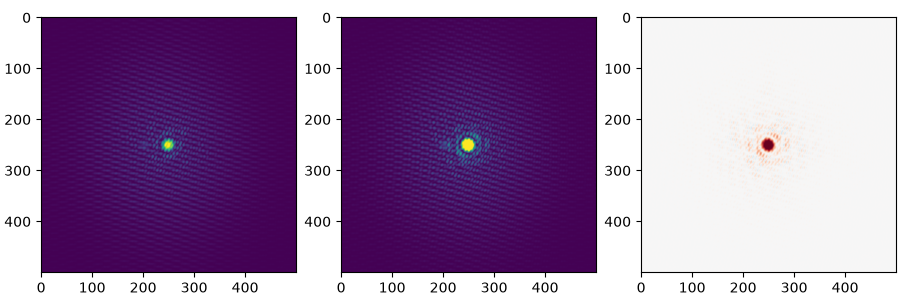

In [22]:
plt.close("all")

for yyyy in range(len(AA))[6:7]:

    im_id = AA[yyyy][0]
    topo_id = AA[yyyy][1]
    dark_id = AA[yyyy][2]


    image, images = load_processing(im_id, crop=None)
    topo, topos = load_processing(topo_id, crop=None)
    if dark_id is not None:
        dark_img = []
        for dark_ids in dark_id[:1]:
            dark, _ = load_processing(dark_ids, crop=None)
            dark_img.append(dark)

        dark = np.average(np.array(dark_img), axis=0)
        #images = images - dark
        #topos  =  topos-dark

    #if dark_id[0]>=1203:
    #    dark*=2
    image=np.average(images, axis=0)
    topo=np.average(topos, axis=0)
    image-=dark
    topo-=dark
    image/= (500*exp_times[yyyy])
    topo/= (500*exp_times[yyyy])
    

    scan_key = "energy"

    # Load energy and add to experimental setup
    experimental_setup["energy"] = load_key(im_id[0],mnemonics["energy"])
    experimental_setup["lambda"] = helper.photon_energy_wavelength(
        experimental_setup["energy"], input_unit="eV"
    )

    center = np.array([1137, 1126])
    shift_c = np.array(image.shape) / 2 - center
    im_c = cci.shift_image(image, shift_c)
    topo_c = cci.shift_image(topo, shift_c)  # centered image


    pos = im_c.copy()
    neg = topo_c.copy()

    crop=500
    pos=pos[pos.shape[0]//2-crop:pos.shape[0]//2+crop,pos.shape[0]//2-crop:pos.shape[0]//2+crop]
    neg=neg[neg.shape[0]//2-crop:neg.shape[0]//2+crop,neg.shape[0]//2-crop:neg.shape[0]//2+crop]

    if False:
        x0=10
        temp=(np.average(pos[:,:x0], axis=1) + np.average(pos[:,-x0:], axis=1) )/2
        temp-=np.average(temp[:750])
        temp=scipy.ndimage.gaussian_filter(temp, 10)
        temp=np.tile(temp, ( pos.shape[0],1)).T
        pos=pos-temp

        #pos-=np.amin(pos)

        temp=(np.average(neg[:,:x0], axis=1) + np.average(neg[:,-x0:], axis=1) )/2
        temp-=np.average(temp[:750])
        temp=scipy.ndimage.gaussian_filter(temp, 10)
        temp=np.tile(temp, ( neg.shape[0],1)).T
        neg=neg-temp

        #neg-=np.amin(neg)

    if binning!=0:
        pos=bin_im(pos)
        neg=bin_im(neg)
    
    
    fig,ax=plt.subplots(1,3, figsize=(9,3))
    ax[0].imshow(np.log10(pos+1e0), vmin=0, vmax=1.1)
    ax[1].imshow(np.log10(neg+1e0), vmin=0, vmax=1.1)
    ax[2].imshow(np.log10( np.abs(pos-neg)+1e0)*np.sign(pos-neg), vmin=-1.3, vmax=1.3, cmap="RdBu")

In [23]:
offset_vmin=0
plt.close("all")
reload(PhR)
for yyyy in  range(len(AA))[:]:

    im_id = AA[yyyy][0]
    topo_id = AA[yyyy][1]
    dark_id = AA[yyyy][2]


    image, images = load_processing(im_id, crop=None)
    topo, topos = load_processing(topo_id, crop=None)
    if dark_id is not None:
        dark_img = []
        for dark_ids in dark_id[:1]:
            dark, _ = load_processing(dark_ids, crop=None)
            dark_img.append(dark)

        dark = np.average(np.array(dark_img), axis=0)
        #images = images - dark
        #topos  =  topos-dark


    image=np.average(images, axis=0)
    topo=np.average(topos, axis=0)
    image-=dark
    topo-=dark
    image/= (500*exp_times[yyyy])
    topo/= (500*exp_times[yyyy])
    

    scan_key = "energy"

    # Load energy and add to experimental setup
    experimental_setup["energy"] = load_key(im_id[0],mnemonics["energy"])
    experimental_setup["lambda"] = helper.photon_energy_wavelength(
        experimental_setup["energy"], input_unit="eV"
    )

    center = np.array([1137, 1126])
    shift_c = np.array(image.shape) / 2 - center
    im_c = cci.shift_image(image, shift_c)
    topo_c = cci.shift_image(topo, shift_c)  # centered image


    pos = im_c.copy()
    neg = topo_c.copy()

    crop=900
    pos=pos[pos.shape[0]//2-crop:pos.shape[0]//2+crop,pos.shape[0]//2-crop:pos.shape[0]//2+crop]
    neg=neg[neg.shape[0]//2-crop:neg.shape[0]//2+crop,neg.shape[0]//2-crop:neg.shape[0]//2+crop]

    if False:
        x0=10
        temp=(np.average(pos[:,:x0], axis=1) + np.average(pos[:,-x0:], axis=1) )/2
        temp-=np.average(temp[:750])
        temp=scipy.ndimage.gaussian_filter(temp, 10)
        temp=np.tile(temp, ( pos.shape[0],1)).T
        pos=pos-temp

        #pos-=np.amin(pos)

        temp=(np.average(neg[:,:x0], axis=1) + np.average(neg[:,-x0:], axis=1) )/2
        temp-=np.average(temp[:750])
        temp=scipy.ndimage.gaussian_filter(temp, 10)
        temp=np.tile(temp, ( neg.shape[0],1)).T
        neg=neg-temp

        #neg-=np.amin(neg)

    if binning!=0:
        pos=bin_im(pos)
        neg=bin_im(neg)
    
    
    
    mask_pixel=pos*0
    prop_dist=0
    phase=0
    
    
    ####################################################
    supportmask3 = np.zeros((2048, 2048))

    tmp = circle_mask(supportmask3.shape,[840,1024],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[932,994],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[1024, 1024],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[932,1150],38) 
    supportmask3 = supportmask3 + tmp

    supportmask3=np.maximum(supportmask3, 0)
    supportmask3=np.minimum(supportmask3, 1)


    supportmask3=(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(supportmask3))))[supportmask3.shape[0]//2-crop:supportmask3.shape[0]//2+crop,supportmask3.shape[0]//2-crop:supportmask3.shape[0]//2+crop]
    if binning!=0:
        supportmask3=bin_im(supportmask3)
    supportmask3=np.abs(np.fft.fftshift(np.fft.ifft2(np.fft.fftshift(supportmask3))))
    supportmask3=1.*(supportmask3>(0.25*np.amax(supportmask3)))

    
    if yyyy==0:
        #########################
        offset_vmin = .01
        recon = fth.reconstruct(
            fth.propagate(pos, prop_dist * 1e-6, experimental_setup=experimental_setup)
            * np.exp(1j * phase)
        )

        roicenter=np.s_[recon.shape[0]//2-10:recon.shape[0]//2+10, recon.shape[0]//2-10:recon.shape[0]//2+10]
        recon*=supportmask
        recon[roicenter]-=np.amin(recon[roicenter][supportmask[roicenter]==1])
        recon*=supportmask
        recon[roicenter]/=np.amax(recon[roicenter])
        if binning==0:
            recon[roicenter]*=np.amax(recon[0:900, 0:1000])
            recon*=supportmask3
            recon[700:900,980:1085][supportmask3[700:900,980:1085]==1]=np.average(recon[700:900,980:1085][supportmask3[700:900,980:1085]==1])
        else:
            recon[roicenter]*=np.amax(recon[0:160, 180:240])
            recon*=supportmask3
            recon[110:190,300:380][supportmask3[110:190,300:380]==1]=np.average(recon[110:190,300:380][supportmask3[110:190,300:380]==1])
        Startimage_p = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(recon)))


        recon = fth.reconstruct(
            fth.propagate(neg, prop_dist * 1e-6, experimental_setup=experimental_setup)
            * np.exp(1j * phase)
        )
        recon*=supportmask
        recon[roicenter]-=np.amin(recon[roicenter][supportmask[roicenter]==1])
        recon*=supportmask
        recon[roicenter]/=np.amax(recon[roicenter])

        if binning==0:
            recon[roicenter]*=np.amax(recon[0:900, 0:1000])
            recon*=supportmask3
            recon[700:900,980:1085][supportmask3[700:900,980:1085]==1]=np.average(recon[700:900,980:1085][supportmask3[700:900,980:1085]==1])
        else:
            recon[roicenter]*=np.amax(recon[0:160, 180:240])
            recon*=supportmask3
            recon[110:190,300:380][supportmask3[110:190,300:380]==1]=np.average(recon[110:190,300:380][supportmask3[110:190,300:380]==1])
        Startimage_n = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(recon)))    
    
    
    #Startimage = None
    Startgamma = None

    (
        retrieved_p,
        retrieved_n,
        retrieved_p_pc,
        retrieved_n_pc,
        bsmask_p,
        bsmask_n,
        gamma_p,
        gamma_n,
    ) = phase_retrieval2(pos, neg, mask_pixel, supportmask, vmin = offset_vmin, Startimage_p=Startimage_p, Startimage_n=Startimage_n, Startgamma=Startgamma)


    np.save("retrieved_p_pc_2_%d.npy"%im_id[0], retrieved_p_pc)
    np.save("retrieved_n_pc_2_%d.npy"%im_id[0], retrieved_n_pc)
    np.save("retrieved_p_2_%d.npy"%im_id[0], retrieved_p)
    np.save("retrieved_n_2_%d.npy"%im_id[0], retrieved_n)    
    
    prop_dist=0.2
    p_pc = cci.reconstruct(
        fth.propagate(
            retrieved_p ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup,
        )
    )

    # Negative partial coherence
    n_pc = cci.reconstruct(
        fth.propagate(
            retrieved_n ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup,
        )
    )

    if binning==0:
        roi = np.s_[790+2: 865+2, 985-1: 1060-1]
    else:
        roi = np.s_[100:190,295:385]
        
    recon=(p_pc/n_pc)[::-1,::-1][roi]
    fig,ax=plt.subplots(1,2)
    ax[0].imshow(np.abs(recon), vmin=0.7, vmax=1.2, cmap="gray")
    ax[1].imshow(np.angle(recon), vmin=-np.pi, vmax=np.pi, cmap="gray")
    plt.savefig("recon_2_%d.png"%im_id[0])
    

    prop_dist=0.2
    p_pc = cci.reconstruct(
        fth.propagate(
            retrieved_p_pc ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup,
        )
    )

    # Negative partial coherence
    n_pc = cci.reconstruct(
        fth.propagate(
            retrieved_n_pc ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup,
        )
    )

    recon=(p_pc/n_pc)[::-1,::-1][roi]
    fig,ax=plt.subplots(1,2)
    ax[0].imshow(np.abs(recon), vmin=0.7, vmax=1.2, cmap="gray")
    ax[1].imshow(np.angle(recon), vmin=-np.pi, vmax=np.pi, cmap="gray")
    plt.savefig("recon_pc_2_%d.png"%im_id[0])
    
    recon=(p_pc+n_pc)[::-1,::-1][roi]
    fig,ax=plt.subplots(2,2)
    ax[0,0].imshow(np.real(recon),cmap="gray")
    ax[0,1].imshow(np.imag(recon), cmap="gray")
    ax[1,0].imshow(np.abs(recon),cmap="gray")
    ax[1,1].imshow(np.angle(recon), cmap="gray")
    plt.savefig("topo_pc_2_%d.png"%im_id[0])
    plt.savefig("topo_pc_2_%d.pdf"%im_id[0])
    
    
print("done!")

/home/riccardo/miniforge3/envs/myenv/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:576: RuntimeWarning: Mean of empty slice
  avg = a.mean(axis, **keepdims_kw)
/home/riccardo/miniforge3/envs/myenv/lib/python3.13/site-packages/numpy/_core/_methods.py:142: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.77 seconds ---
############   -   CDI_pc
--- 14.1 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.64 seconds ---
############   -   CDI_pc
--- 13.96 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.68 seconds ---
############   -   CDI_pc
--- 14.06 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.67 seconds ---
############   -   CDI_pc
--- 14.11 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.64 seconds ---
############   -   CDI_pc
--- 14.09 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.67 seconds ---
############   -   CDI_pc
--- 14.15 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.64 seconds ---
#######

/tmp/ipykernel_154162/3436167899.py:224: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax=plt.subplots(2,2)


no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.68 seconds ---
############   -   CDI_pc
--- 14.21 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.7 seconds ---
############   -   CDI_pc
--- 14.24 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.65 seconds ---
############   -   CDI_pc
--- 14.17 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.69 seconds ---
############   -   CDI_pc
--- 14.22 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.68 seconds ---
############   -   CDI_pc
--- 14.22 seconds ---
Phase Retrieval Done!
no offset subtraction
CDI - larger mask
############ -   CDI
--- 2.53 seconds ---
############   -   CDI_pc
--- 14.06 seconds ---
Phase Retrieval Done!
done!


In [ ]:
%matplotlib widget
plt.close("all")


prop_dist=0.2
p_pc = cci.reconstruct(
    fth.propagate(
        retrieved_p_pc ,
        prop_dist * 1e-6,
        experimental_setup=experimental_setup,
    )
)

# Negative partial coherence
n_pc = cci.reconstruct(
    fth.propagate(
        retrieved_n_pc ,
        prop_dist * 1e-6,
        experimental_setup=experimental_setup,
    )
)



roi = np.s_[:,:]#895-2: 975-2, 1110-1: 1190-1]
roi = np.s_[795: 875-2, 970-1: 1070-1]
if binning==0:
    roi = np.s_[790+2: 865+2, 985-1: 1060-1]
else:
    roi = np.s_[100:190,295:385]

roi=np.s_[490:570,300:380]
        
recon=(p_pc+n_pc)[:,:][roi]
fig,ax=plt.subplots(1,4, figsize=(12,3))
ax[0].imshow(np.abs(recon),cmap="gray" )
ax[1].imshow(np.angle(recon), cmap="gray" )
ax[2].imshow(np.real(recon),cmap="gray")
ax[3].imshow(np.imag(recon),cmap="gray")
plt.show()

In [29]:
%matplotlib widget
plt.close("all")


prop_dist=0.2
p_pc = cci.reconstruct(
    fth.propagate(
        pos ,
        prop_dist * 1e-6,
        experimental_setup=experimental_setup,
    )
)

# Negative partial coherence
n_pc = cci.reconstruct(
    fth.propagate(
        neg ,
        prop_dist * 1e-6,
        experimental_setup=experimental_setup,
    )
)



roi = np.s_[:,:]#895-2: 975-2, 1110-1: 1190-1]
roi = np.s_[795: 875-2, 970-1: 1070-1]
if binning==0:
    roi = np.s_[790+2: 865+2, 985-1: 1060-1]
else:
    roi = np.s_[100:190,295:385]

roi=np.s_[490:570,300:380]
        
recon=(p_pc+n_pc)[:,:][roi]
fig,ax=plt.subplots(1,4, figsize=(12,3))
ax[0].imshow(np.abs(recon),cmap="gray" )
ax[1].imshow(np.angle(recon), cmap="gray" )
ax[2].imshow(np.real(recon),cmap="gray")
ax[3].imshow(np.imag(recon),cmap="gray")

plt.savefig("modulations.pdf")
plt.savefig("modulations.png")

In [24]:
%matplotlib widget
plt.close("all")


prop_dist=0.2
p_pc = cci.reconstruct(
    fth.propagate(
        retrieved_p ,
        prop_dist * 1e-6,
        experimental_setup=experimental_setup,
    )
)

# Negative partial coherence
n_pc = cci.reconstruct(
    fth.propagate(
        retrieved_n,
        prop_dist * 1e-6,
        experimental_setup=experimental_setup,
    )
)



roi = np.s_[:,:]#895-2: 975-2, 1110-1: 1190-1]
roi = np.s_[795: 875-2, 970-1: 1070-1]
if binning==0:
    roi = np.s_[790+2: 865+2, 985-1: 1060-1]
else:
    roi = np.s_[100:190,295:385]

roi=np.s_[490:570,300:380]
        
recon=(p_pc/n_pc)[:,:][roi]
fig,ax=plt.subplots(1,4, figsize=(12,3))
ax[0].imshow(np.abs(recon), vmin=0., vmax=2.5, )
ax[1].imshow(np.angle(recon), vmin=-np.pi, vmax=np.pi, )
ax[1].imshow(np.angle(recon), vmin=-np.pi, vmax=np.pi, )
plt.show()

NameError: name 'retrieved_p' is not defined

In [25]:
plt.close("all")
# Setup phase and propagation for cdi once
phase_cdi = 0
prop_dist_cdi = 0
dx = 0
dy = 0


from scipy.ndimage import zoom
import scipy

def zoom_binary_integer(binary, M):
    """
    Integer zoom of a binary image by factor M,
    followed by center-crop back to original size.
    
    binary: (N,N) array with values {0,1}
    M: integer zoom factor (2,3,4,...)
    """
    N = binary.shape[0]
    assert binary.shape == (N, N)
    assert int(M) == M and M >= 1

    # pixel replication
    zoomed = np.kron(binary, np.ones((M, M), dtype=binary.dtype))

    Nz = zoomed.shape[0]
    start = (Nz - N) // 2
    end = start + N

    return zoomed[start:end, start:end]



def rescale_binary_shape(binary, P, threshold=0.5, order=1):
    """
    Rescale a binary image (NxN) to (PxP) using interpolation
    and re-binarization.

    order=1 -> bilinear (recommended)
    order=0 -> nearest neighbor (blocky)
    """
    N = binary.shape[0]
    assert binary.shape == (N, N)

    scale = P / N
    resized = zoom(binary.astype(float), scale, order=order)

    # zoom() may produce off-by-one shapes due to rounding
    resized = resized[:P, :P]

    return (resized > threshold).astype(binary.dtype)


def phase_retrieval(
    pos, neg, mask_pixel, supportmask, vmin = 0, Startimage=None, Startgamma=None,modes=[1],partial_coherence = True
):

    Nmodes=len(modes)
    algorithm_list = ["mine", "mine", "mine"]
    Nit_list = [300, 60, 60]
    algorithm_list_pc = ["mine", "ER", "ER"]
    Nit_list_pc = [700, 50, 50]
    RL_freq = 20
    RL_it = 50
    average_img = 5
    real_object = False  # always set to False    
    
    # Prepare Input holograms
    pos2 = pos.copy()
    neg2 = neg.copy()
    mask_pixel2=mask_pixel.copy()
    supportmask2=supportmask.copy()
    
    crop=0
    
    if crop>0:
        pos2=pos2[crop:-crop,crop:-crop]
        neg2=neg2[crop:-crop,crop:-crop]
        mask_pixel2=mask_pixel[crop:-crop,crop:-crop]  
        if supportmask2.ndim==2:
            supportmask2=rescale_binary_shape(supportmask2, pos2.shape[0], threshold=0.5, order=1)
        elif supportmask2.ndim==3 and supportmask2.shape[1]!=pos2.shape[1]:
            supportmask2=np.zeros((Nmodes,pos2.shape[0], pos2.shape[1]))
            for m in range(Nmodes):
                supportmask2[m]=rescale_binary_shape(supportmask[m], pos2.shape[0], threshold=0.5, order=1)
            
        
    (l,n) = pos2.shape  
        
    
    if type(vmin)!=type(None):
        mi, _ = np.percentile(pos2[pos2 != 0], [vmin, 99.9])
        pos2 = pos2 - mi
        mi, _ = np.percentile(neg2[neg2 != 0], [vmin, 99.9])
        neg2 = neg2 - mi
    pos2[pos2 < 0] = 0
    neg2[neg2 < 0] = 0
    pos2 = pos2.astype(complex)
    neg2 = neg2.astype(complex)

    bsmask_p = mask_pixel2.copy()
    bsmask_p[pos2 <= 0] = 1
    bsmask_n = mask_pixel2.copy()
    bsmask_n[neg2 <= 0] = 1

    
    
    
    supportmask3    =  np.zeros((Nmodes, l,n))
    #get masks
    if supportmask2.ndim==2:
        for m in range(Nmodes):
            if modes[m]==1:
                supportmask3[m] = supportmask2.copy()
            else:
                supportmask3[m] = zoom_binary_integer(supportmask2, modes[m])
    else:
        supportmask3=supportmask2.copy()
        

    # Setup start image and startgamma
    if Startimage is None:
        Startimage3    =  np.zeros((Nmodes, l,n), dtype=complex)
        for m in range(Nmodes):
            
            Startimage = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(supportmask3[m])))
            x = (np.sqrt(np.maximum(pos2, np.zeros(pos2.shape)))[mask_pixel2 == 0]).flatten()
            y = ((np.abs(Startimage))[mask_pixel2 == 0]).flatten()
            res = stats.linregress(x, y)
            Startimage -= res.intercept
            Startimage /= res.slope
            Startimage3[m]=(1/(m*0+1)**2)*Startimage*np.exp(1j*np.pi/4*m)

    else:
        Startimage3 = Startimage.copy()
        
    #Startimage3*=np.exp(1j*np.pi*np.random.rand(Nmodes, 1448, 1448))
    
    if Startgamma is None:
        Startgamma = np.ones(pos2.shape) * 1e-6 * 2
        Startgamma[pos2.shape[0] // 2, pos2.shape[1] // 2] = 0.7
    else:
        Startgamma = Startgamma.copy()
        
    fig,ax=plt.subplots(2,Nmodes+1)
    crop=655
    mi=0
    ma=5000
    cmap="CMRmap"
    roi2=np.s_[crop:-crop, crop:-crop]
    ax[0,0].imshow(np.abs(pos2)[roi2], vmin=mi, vmax=ma, cmap=cmap)
    if supportmask2.ndim==2:
        ax[1,0].imshow((supportmask2))
    else:
        ax[1,0].imshow((supportmask2[0]))
    for i in range(Nmodes):
        ax[0,i+1].imshow((np.abs(Startimage3[i])**2)[roi2], vmin=mi, vmax=ma, cmap=cmap)
        ax[1,i+1].imshow((supportmask3[i]))
        ax[0,i+1].set_title("retrieved - %d mode"%i)
    ax[0,0].set_title("holo - experimental")
    plt.show()


    #pos2+=1000
    #neg2+=1000



    # Execute Phase retrieval
    start_time = time.time()
    
    for i in range(len(Nit_list) // 3):

        # Positive helicity - beta_mode="arctan"
        retrieved_p, Error_diff_p, Error_supp,_,_  = PhR2.PhaseRtrv_GPU2(
            diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
            mask=supportmask3,
            mode=algorithm_list[3 * i],
            beta_zero=0.5,
            Nit=Nit_list[3 * i],
            beta_mode="arctan",
            plot_every=349,
            Phase=Startimage3,
            bsmask=bsmask_p,
            average_img=average_img,
            Nmodes=Nmodes,
        )
        # Positive helicity - beta_mode="const"
        retrieved_p, Error_diff_p2, Error_supp,_ ,_ = PhR2.PhaseRtrv_GPU2(
            diffract=np.sqrt(np.maximum(pos2, np.zeros(pos2.shape))),
            mask=supportmask3,
            mode=algorithm_list[3 * i + 1],
            beta_zero=0.5,
            Nit=Nit_list[3 * i + 1],
            beta_mode="const",
            plot_every=24,
            Phase=retrieved_p,
            bsmask=bsmask_p,
            average_img=average_img,
            Nmodes=Nmodes,
        )
        # Negative helicity - beta_mode="arctan"
        retrieved_n, Error_diff_n2, Error_supp,_ ,_ = PhR2.PhaseRtrv_GPU2(
            diffract=np.sqrt(np.maximum(neg2, np.zeros(neg2.shape))),
            mask=supportmask3,
            mode=algorithm_list[3 * i + 2],
            beta_zero=0.5,
            Nit=Nit_list[3 * i + 2],
            beta_mode="const",
            plot_every=24,
            Phase=retrieved_p * np.sqrt(np.sum(neg2) / np.sum(pos2)),
            bsmask=bsmask_n,
            average_img=average_img,
            Nmodes=Nmodes,
        )

        print("--- %s seconds ---" % np.round((time.time() - start_time), 2))

        Startimage3 = retrieved_p.copy()

        # Partial coherence phase retrieval
        if partial_coherence:
            pass
        else:
            retrieved_p_pc,retrieved_n_pc,gamma_p,gamma_n=0,0,0,0
    print("Phase Retrieval Done!")

    return (
        retrieved_p,
        retrieved_n,
        retrieved_p_pc,
        retrieved_n_pc,
        bsmask_p,
        bsmask_n,
        gamma_p,
        gamma_n,
    )

In [26]:
binning=2

In [28]:
plt.close("all")

for yyyy in  range(len(AA))[:]:

    im_id = AA[yyyy][0]
    topo_id = AA[yyyy][1]
    dark_id = AA[yyyy][2]

    print(im_id)


    image, images = load_processing(im_id, crop=None)
    topo, topos = load_processing(topo_id, crop=None)
    if dark_id is not None:
        dark_img = []
        for dark_ids in dark_id[:1]:
            dark, _ = load_processing(dark_ids, crop=None)
            dark_img.append(dark)

        dark = np.average(np.array(dark_img), axis=0)
        #images = images - dark
        #topos  =  topos-dark


    image=np.average(images, axis=0)
    topo=np.average(topos, axis=0)
    image-=dark
    topo-=dark
    image/= (500*exp_times[yyyy])
    topo/= (500*exp_times[yyyy])
    

    scan_key = "energy"

    # Load energy and add to experimental setup
    experimental_setup["energy"] = load_key(im_id[0],mnemonics["energy"])
    experimental_setup["lambda"] = helper.photon_energy_wavelength(
        experimental_setup["energy"], input_unit="eV"
    )

    center = np.array([1137, 1126])
    shift_c = np.array(image.shape) / 2 - center
    im_c = cci.shift_image(image, shift_c)
    topo_c = cci.shift_image(topo, shift_c)  # centered image


    pos = im_c.copy()
    neg = topo_c.copy()

    crop=900
    pos=pos[pos.shape[0]//2-crop:pos.shape[0]//2+crop,pos.shape[0]//2-crop:pos.shape[0]//2+crop]
    neg=neg[neg.shape[0]//2-crop:neg.shape[0]//2+crop,neg.shape[0]//2-crop:neg.shape[0]//2+crop]

    if False:
        x0=10
        temp=(np.average(pos[:,:x0], axis=1) + np.average(pos[:,-x0:], axis=1) )/2
        temp-=np.average(temp[:750])
        temp=scipy.ndimage.gaussian_filter(temp, 10)
        temp=np.tile(temp, ( pos.shape[0],1)).T
        pos=pos-temp

        #pos-=np.amin(pos)

        temp=(np.average(neg[:,:x0], axis=1) + np.average(neg[:,-x0:], axis=1) )/2
        temp-=np.average(temp[:750])
        temp=scipy.ndimage.gaussian_filter(temp, 10)
        temp=np.tile(temp, ( neg.shape[0],1)).T
        neg=neg-temp

        #neg-=np.amin(neg)

    if binning!=0:
        pos=bin_im(pos)
        neg=bin_im(neg)
    
    
    
    mask_pixel=pos*0
    prop_dist=0
    phase=0
    
    
    ####################################################
    supportmask3 = np.zeros((2048, 2048))

    tmp = circle_mask(supportmask3.shape,[840,1024],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[932,994],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[1024, 1024],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[932,1150],38)#38 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[131+800,254+800],3) 
    supportmask3 = supportmask3 + tmp
    #tmp = circle_mask(supportmask3.shape,[40+800,284+800],3) 
    #supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[223+800,164+800],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[147+600,194+800],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[147+600,254+800],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[55+600,224+800],3) 
    supportmask3 = supportmask3 + tmp

    supportmask3=np.maximum(supportmask3, 0)
    supportmask3=np.minimum(supportmask3, 1)

    supportmask3=(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(supportmask3))))[supportmask3.shape[0]//2-crop:supportmask3.shape[0]//2+crop,supportmask3.shape[0]//2-crop:supportmask3.shape[0]//2+crop]
    if binning!=0:
        supportmask3=bin_im(supportmask3)
    supportmask3=np.abs(np.fft.fftshift(np.fft.ifft2(np.fft.fftshift(supportmask3))))
    supportmask3=1.*(supportmask3>(0.25*np.amax(supportmask3)))

    if yyyy==0:
        #########################
        offset_vmin = .01
        recon = fth.reconstruct(
            fth.propagate(pos, prop_dist * 1e-6, experimental_setup=experimental_setup)
            * np.exp(1j * phase)
        )

        roicenter=np.s_[recon.shape[0]//2-10:recon.shape[0]//2+10, recon.shape[0]//2-10:recon.shape[0]//2+10]
        recon*=supportmask
        recon[roicenter]-=np.amin(recon[roicenter][supportmask[roicenter]==1])
        recon*=supportmask
        recon[roicenter]/=np.amax(recon[roicenter])
        if binning==0:
            recon[roicenter]*=np.amax(recon[0:900, 0:1000])
            recon*=supportmask3
            recon[700:900,980:1085][supportmask3[700:900,980:1085]==1]=np.average(recon[700:900,980:1085][supportmask3[700:900,980:1085]==1])
        else:
            recon[roicenter]*=np.amax(recon[0:160, 180:240])
            recon*=supportmask3
            recon[110:190,300:380][supportmask3[110:190,300:380]==1]=np.average(recon[110:190,300:380][supportmask3[110:190,300:380]==1])
        Startimage_p = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(recon)))


        recon = fth.reconstruct(
            fth.propagate(neg, prop_dist * 1e-6, experimental_setup=experimental_setup)
            * np.exp(1j * phase)
        )
        recon*=supportmask
        recon[roicenter]-=np.amin(recon[roicenter][supportmask[roicenter]==1])
        recon*=supportmask
        recon[roicenter]/=np.amax(recon[roicenter])

        if binning==0:
            recon[roicenter]*=np.amax(recon[0:900, 0:1000])
            recon*=supportmask3
            recon[700:900,980:1085][supportmask3[700:900,980:1085]==1]=np.average(recon[700:900,980:1085][supportmask3[700:900,980:1085]==1])
        else:
            recon[roicenter]*=np.amax(recon[0:160, 180:240])
            recon*=supportmask3
            recon[110:190,300:380][supportmask3[110:190,300:380]==1]=np.average(recon[110:190,300:380][supportmask3[110:190,300:380]==1])
        Startimage_n = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(recon)))    

    Startimage =None#Startimage_p.copy()
    Startgamma = None
    modes=[1,2]
    Nmodes=len(modes)

    temp=supportmask.copy()
    temp=temp*0
    x0=temp.shape[0]//2
    temp[x0-50:x0+50,x0-50:x0+50]=1
    supportmask2=supportmask3.copy()
    #np.array([supportmask.copy(),temp])

    (
        retrieved_p,
        retrieved_n,
        retrieved_p_pc,
        retrieved_n_pc,
        bsmask_p,
        bsmask_n,
        gamma_p,
        gamma_n,
    ) = phase_retrieval(pos, neg, mask_pixel.astype(int), supportmask2, vmin = offset_vmin, Startimage=Startimage, Startgamma=Startgamma, modes = modes, partial_coherence = False)


    #np.save("retrieved_p_pc_2_%d.npy"%im_id[0], retrieved_p_pc)
    #np.save("retrieved_n_pc_2_%d.npy"%im_id[0], retrieved_n_pc)
    #np.save("retrieved_p_2_%d.npy"%im_id[0], retrieved_p)
    #np.save("retrieved_n_2_%d.npy"%im_id[0], retrieved_n)    
    
    prop_dist=0.2
    p_pc = cci.reconstruct(
        fth.propagate(
            retrieved_p[0] ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup,
        )
    )

    # Negative partial coherence
    n_pc = cci.reconstruct(
        fth.propagate(
            retrieved_n[0] ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup,
        )
    )

    if binning==0:
        roi = np.s_[790+2: 865+2, 985-1: 1060-1]
    else:
        roi = np.s_[100:190,295:385]
        
    recon=(p_pc/n_pc)[::-1,::-1][roi]
    fig,ax=plt.subplots(1,2)
    ax[0].imshow(np.abs(recon), vmin=0.7, vmax=1.2, cmap="gray")
    ax[1].imshow(np.angle(recon), vmin=-np.pi, vmax=np.pi, cmap="gray")

    

    
print("done!")


[1152]


TypeError: ufunc 'stdtr' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

In [ ]:
retrieved_p.shape

In [29]:
%matplotlib widget
plt.close("all")

fig,ax=plt.subplots(1,4, figsize=(12,3))
for i in [0,1]:
    
    prop_dist=0.2
    p_pc = cci.reconstruct(
        fth.propagate(
            retrieved_p[i] ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup,
        )
    )
    
    # Negative partial coherence
    n_pc = cci.reconstruct(
        fth.propagate(
            retrieved_n[i] ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup,
        )
    )
    
    
    roi = np.s_[:,:]#895-2: 975-2, 1110-1: 1190-1]
    roi = np.s_[795: 875-2, 970-1: 1070-1]
    if binning==0:
        roi = np.s_[790+2: 865+2, 985-1: 1060-1]
    else:
        roi = np.s_[100:190,295:385]
    
    roi=np.s_[490:570,300:380]
            
    recon=(p_pc).copy()#[:,:][roi]
    ax[i].imshow(np.abs(recon), vmax=1e-2)
    
plt.show()

NameError: name 'retrieved_p' is not defined

In [30]:
fig,ax=plt.subplots(1,4, figsize=(12,3), sharex=True, sharey=True)
ax[0].imshow(pos, vmin=0., vmax=2.5, )
ax[1].imshow(np.abs(retrieved_p[0])**2, vmin=0., vmax=2.5, )
ax[2].imshow(np.abs(retrieved_p[1])**2, vmin=0., vmax=2.5, )
ax[3].imshow(np.angle(recon), vmin=-np.pi, vmax=np.pi, )
plt.show()

NameError: name 'retrieved_p' is not defined

In [31]:
temp=np.abs(fth.reconstruct(retrieved_p[0]))
plt.close("all")
temp=fth.reconstruct(supportmask3)

xx,yy=np.arange(temp.shape[0])-temp.shape[0]//2,np.arange(temp.shape[0])-temp.shape[0]//2
xx,yy=np.meshgrid(xx,yy)

#temp+=np.roll(fth.reconstruct(supportmask3), shift=-100)
#temp+=np.roll((fth.reconstruct(supportmask3)*np.exp(1j*yy)), shift=100)

sy=3
temp=1*temp+1e-6*np.exp(-((xx+50)/sy)**2-((yy-0)/sy)**2)
temp=np.abs(temp)**2
#temp=temp+np.roll(np.abs(fth.reconstruct(supportmask3))**2, shift=-100)
temp=temp+0*np.sin(yy)
temp2=np.abs(fth.reconstruct(temp))
temp2/=np.amax(temp2)

NameError: name 'retrieved_p' is not defined

In [32]:
fig,ax=plt.subplots(1,3, figsize=(15,5))
ma=np.percentile(temp, 99.9)
ax[0].imshow(temp, vmax=ma, cmap="CMRmap")
ma=np.percentile(temp2, 95)
ax[1].imshow(temp2, vmax=ma, cmap="CMRmap")
ma=np.percentile(temp2, 90)
ax[2].imshow(temp2, vmax=ma, cmap="CMRmap")

NameError: name 'temp2' is not defined

interactive(children=(FloatRangeSlider(value=(0.0, 1.0), description='contrast', layout=Layout(width='500px'),…

(<Figure size 700x700 with 1 Axes>, <Axes: >)

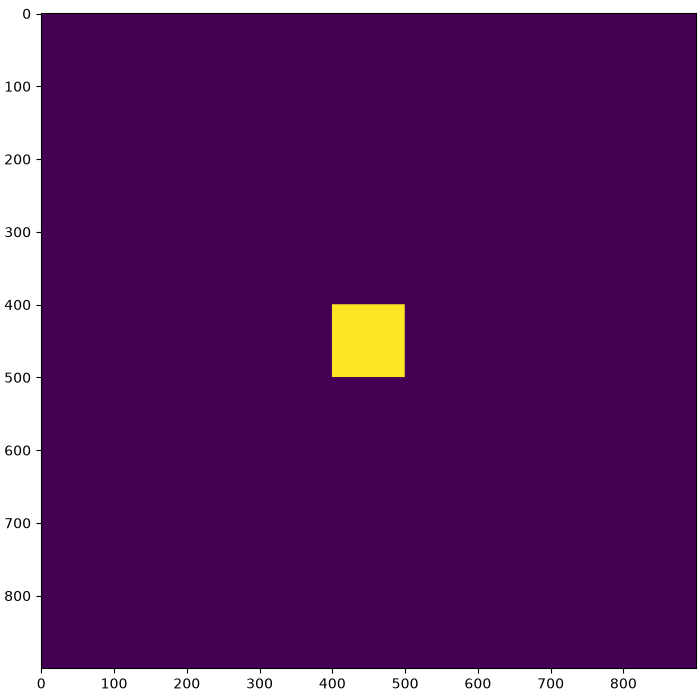

In [33]:
cimshow(temp)

In [34]:

for yyyy in  range(len(AA))[6:7]:

    im_id = AA[yyyy][0]
    topo_id = AA[yyyy][1]
    dark_id = AA[yyyy][2]

    image, images = load_processing(im_id, crop=None)
    topo, topos = load_processing(topo_id, crop=None)
    if dark_id is not None:
        dark_img = []
        for dark_ids in dark_id[:1]:
            dark, _ = load_processing(dark_ids, crop=None)
            dark_img.append(dark)

        dark = np.average(np.array(dark_img), axis=0)
        #images = images - dark
        #topos  =  topos-dark

    image=np.average(images, axis=0)
    topo=np.average(topos, axis=0)
    image-=dark
    topo-=dark
    image/= (500*exp_times[yyyy])
    topo/= (500*exp_times[yyyy])


    center = np.array([1137, 1126])
    shift_c = np.array(image.shape) / 2 - center
    im_c = cci.shift_image(image, shift_c)
    topo_c = cci.shift_image(topo, shift_c)  # centered image

    pos = im_c.copy()
    neg = topo_c.copy()

    crop=0
    if crop>0:
        pos=pos[pos.shape[0]//2-crop:pos.shape[0]//2+crop,pos.shape[0]//2-crop:pos.shape[0]//2+crop]
        neg=neg[neg.shape[0]//2-crop:neg.shape[0]//2+crop,neg.shape[0]//2-crop:neg.shape[0]//2+crop]


    if binning!=0:
        pos=bin_im(pos)
        neg=bin_im(neg)


    ####################################################
    supportmask3 = np.zeros((2048, 2048))

    tmp = circle_mask(supportmask3.shape,[840,1024],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[932,994],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[1024, 1024],3) 
    supportmask3 = supportmask3 + tmp
    tmp = circle_mask(supportmask3.shape,[932,1150],38)#38 
    supportmask3 = supportmask3 + tmp

    supportmask3=np.maximum(supportmask3, 0)
    supportmask3=np.minimum(supportmask3, 1)

    if crop>0:
        supportmask3=(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(supportmask3))))[supportmask3.shape[0]//2-crop:supportmask3.shape[0]//2+crop,supportmask3.shape[0]//2-crop:supportmask3.shape[0]//2+crop]
    else:
        supportmask3=(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(supportmask3))))

    if binning!=0:
        supportmask3=bin_im(supportmask3)
    supportmask3=np.abs(np.fft.fftshift(np.fft.ifft2(np.fft.fftshift(supportmask3))))
    supportmask3=1.*(supportmask3>(0.25*np.amax(supportmask3)))

    
    print(pos.shape, supportmask3.shape)
    

(1024, 1024) (1024, 1024)


In [35]:
%matplotlib widget
temp=np.abs(fth.reconstruct(pos+neg))[:,:]
plt.close("all")

cimshow(temp)

interactive(children=(FloatRangeSlider(value=(1.4335533577991554e-07, 0.011401894968003966), description='cont…

(<Figure size 700x700 with 1 Axes>, <Axes: >)

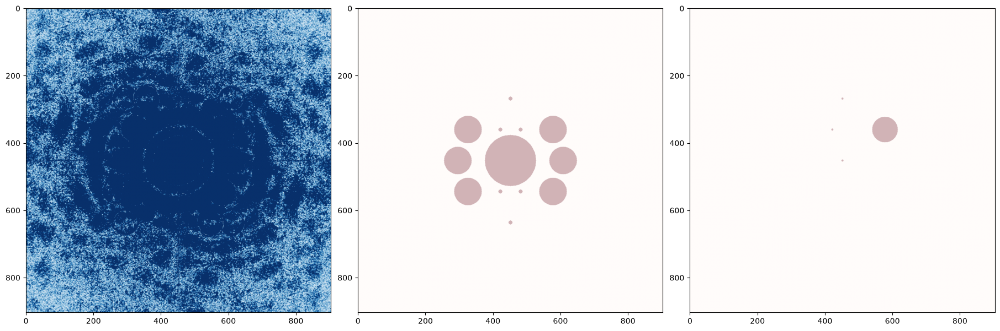

In [36]:
%matplotlib inline

temp=supportmask3.copy()
temp=np.abs(fth.reconstruct(temp))**2
temp=np.abs(fth.reconstruct(temp))
roi=np.s_[60:-60,60:-60]

plt.close("all")
fig,ax=plt.subplots(1,3, figsize=(18,6))

ax[0].imshow(np.abs(fth.reconstruct(pos+neg))[roi], vmax=0.000005, cmap="Blues")
#ax.imshow(supportmask, alpha=0.5, cmap="Reds")

ax[1].imshow(temp[roi], alpha=0.3, cmap="Reds", vmax=1e-18)

ax[2].imshow(supportmask3[roi], alpha=0.3, cmap="Reds", vmax=1e-10)


plt.show()

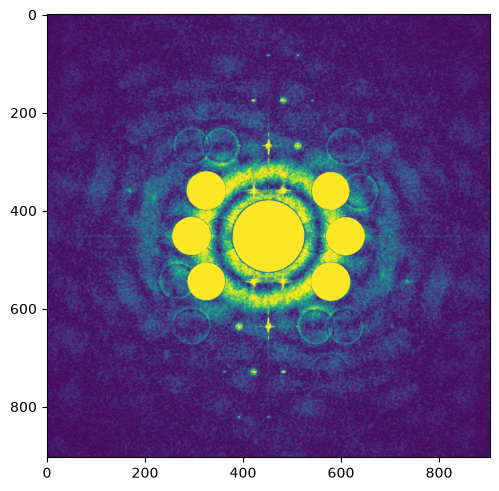

In [37]:
fig,ax=plt.subplots()
ax.imshow(np.abs(fth.reconstruct(pos+neg))[roi], vmax=5e-5)

/tmp/ipykernel_9328/2231800978.py:73: RuntimeWarning: divide by zero encountered in log
  ax[0].imshow(np.log(np.abs(recon)), vmin=-1.5, vmax=1.5)
/tmp/ipykernel_9328/2231800978.py:84: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


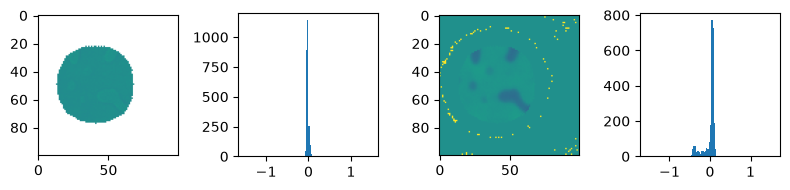

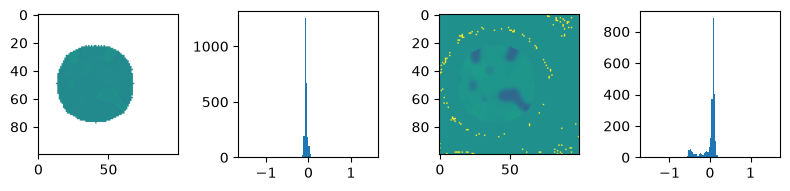

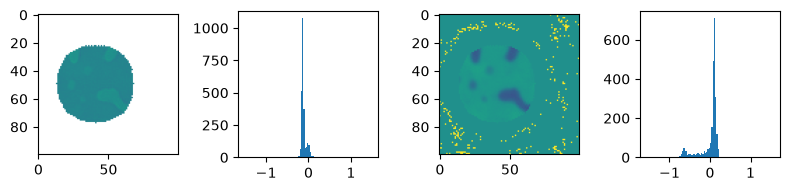

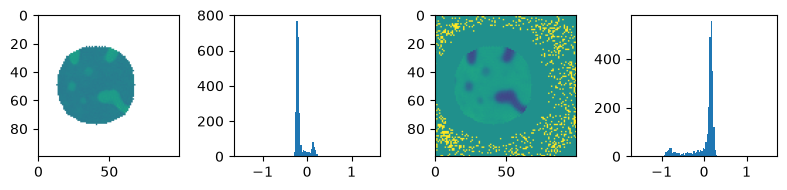

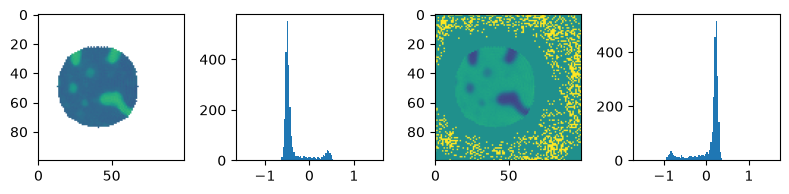

...

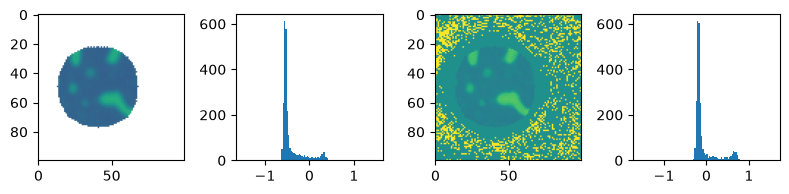

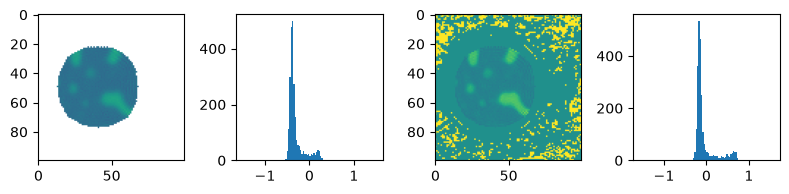

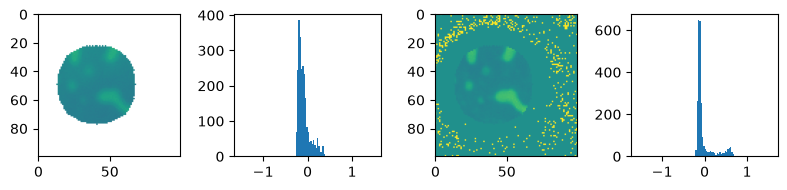

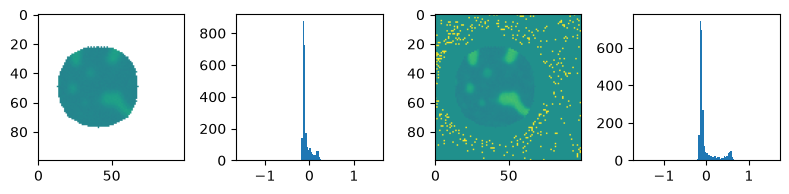

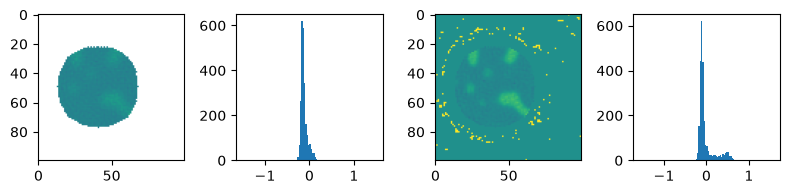

In [40]:
%matplotlib inline

plt.close("all")


A=[[],[],[],[],[],[],[],[],[],[],[],[],[],[]]
phi=[[],[],[],[],[],[],[],[],[],[],[],[],[],[]]
E=[]

ABS=[]
PHASE=[]
E=[]

recons= []  # for gifs
for yyyy in  range(len(AA)):
    
    im_id = AA[yyyy][0]
    topo_id = AA[yyyy][1]
    dark_id = AA[yyyy][2]
    
    
    # Load energy and add to experimental setup
    experimental_setup["energy"] = load_key(im_id[0],mnemonics["energy"])
    experimental_setup["lambda"] = helper.photon_energy_wavelength(
        experimental_setup["energy"], input_unit="eV"
    )
    
    retrieved_p_pc=np.load("retrieved_p_pc_2_%d.npy"%im_id[0])
    retrieved_n_pc=np.load("retrieved_n_pc_2_%d.npy"%im_id[0])
    
    
    #prop_dist=0.2
    p_pc = cci.reconstruct(
        fth.propagate(
            retrieved_p_pc ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup))
    n_pc = cci.reconstruct(
        fth.propagate(
            retrieved_n_pc ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup))


    if binning==0:
        roi = np.s_[790+2: 865+2, 985-1: 1060-1]
    else:
        roi = np.s_[100:190,295:385]
        
    roi=np.s_[320:420,520:620]
    mask2=scipy.ndimage.binary_erosion(supportmask[roi], iterations=6)
    recon= ((p_pc/n_pc)[::-1,::-1])
 
    A[7].append(np.abs(recon)[62,224])
    phi[7].append(np.angle(recon)[62,224])
    A[8].append(np.abs(recon)[143,197])
    phi[8].append(np.angle(recon)[143,197])
    A[9].append(np.abs(recon)[224,224])
    phi[9].append(np.angle(recon)[224,224])

    recon=recon[roi]*mask2
    
    
    #fig,ax=plt.subplots(1,2)
    #ax[0].imshow(np.abs(recon), vmin=0, vmax=4, cmap="gray")
    #ax[1].imshow(np.angle(recon), vmin=-np.pi, vmax=np.pi, cmap="gray")
    #plt.show()
    
    
    

    fig,ax=plt.subplots(1,4, figsize=(8,2))
    ax[0].imshow(np.log(np.abs(recon)), vmin=-1.5, vmax=1.5)
    a_abs=ax[1].hist(np.log(np.abs(recon)[mask2!=0]).flatten(), bins=100, range=(-1.5,1.5))
    
    ax[2].imshow(np.angle(recon), cmap="viridis", vmin=-np.pi/2, vmax=np.pi/2)
    a_phase=ax[3].hist(np.angle(recon)[mask2!=0].flatten(), bins=100, range=(-np.pi/2, np.pi/2))
    
    ABS.append(a_abs[0])
    PHASE.append(a_phase[0])
    E.append(experimental_setup["energy"])
    
    
    fig.tight_layout()
    #ax[0,1].set_ylim(0,1000)
    #ax[1,1].set_ylim(0,1000)
    
    plt.show()
    
    if False:
        RGB=np.zeros((recon.shape[0],recon.shape[1],3))
        RGB[:,:,0]=(np.angle(recon)+np.pi)/(2*np.pi)
        RGB[:,:,1]=np.abs(recon)/2
        RGB[:,:,2]=np.abs(recon)/2
        from matplotlib.colors import hsv_to_rgb
        RGB = hsv_to_rgb(RGB)

        fig,ax=plt.subplots()
        ax.imshow(RGB)    
        plt.show()
    
    plt.close("all")

    A[0].append(a_abs[1][np.argmax(a_abs[0])])
    phi[0].append(a_phase[1][np.argmax(a_phase[0])])
 
    A[1].append(np.average(np.abs(recon)))
    phi[1].append(np.average(np.angle(recon)))
    A[2].append(np.average(np.abs(recon)))
    phi[2].append(np.average(np.angle(recon)))
    
    A[3].append(np.abs(recon)[52,50])
    phi[3].append(np.angle(recon)[52,50])
    A[4].append(np.abs(recon)[40,50])
    phi[4].append(np.angle(recon)[40,50])
 
    
    A[5].append(np.abs(recon)[35,35])
    phi[5].append(np.angle(recon)[35,35])
    A[6].append(np.abs(recon)[45,22])
    phi[6].append(np.angle(recon)[45,22])
    
    
    E.append(experimental_setup["energy"])

0j


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


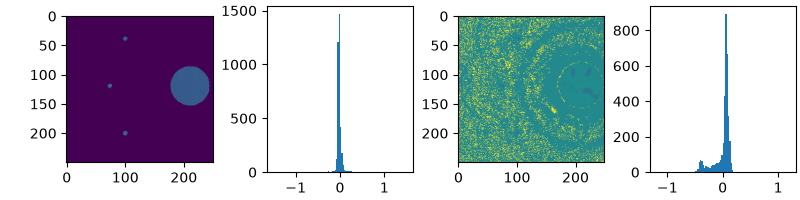

0j


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


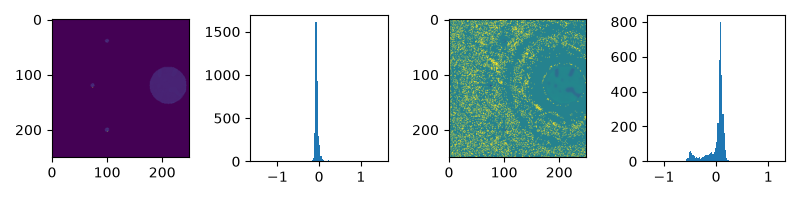

-0j


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


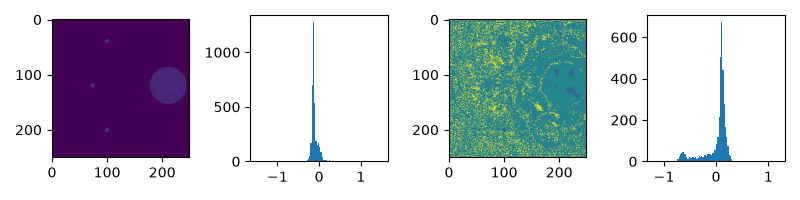

-0j


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


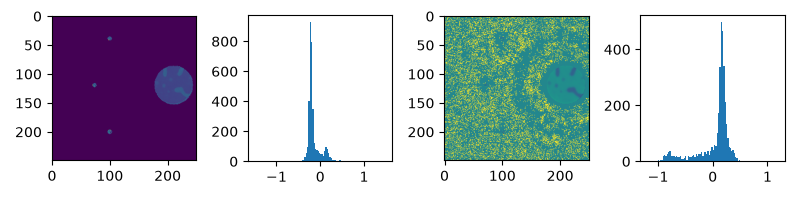

0j


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


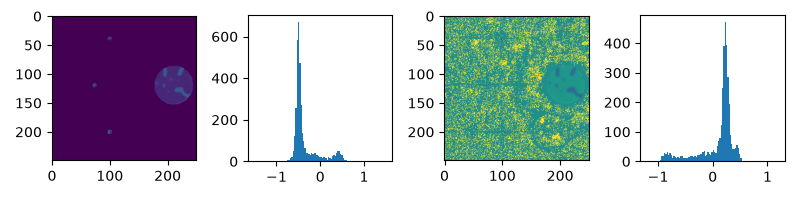

0j


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


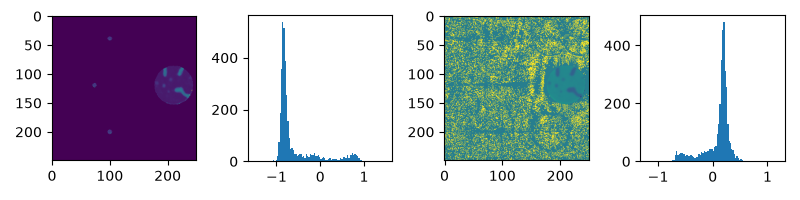

(-0+0j)


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


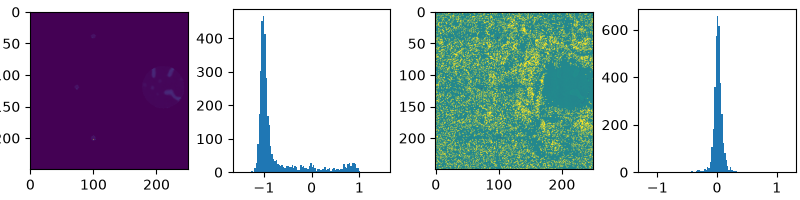

(-0+0j)


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


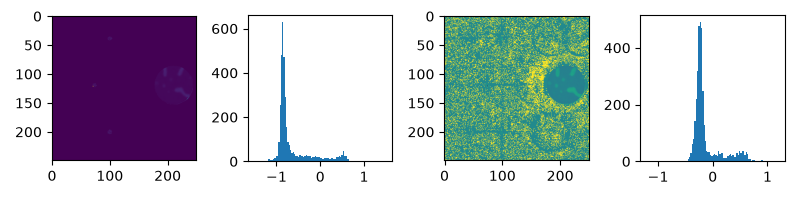

0j


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


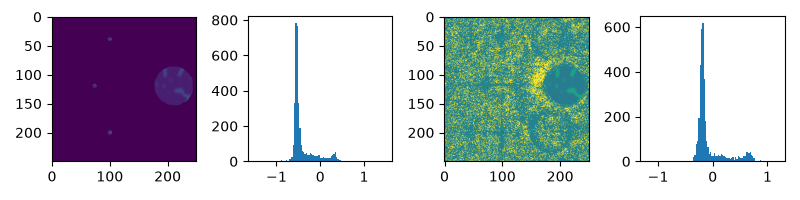

0j


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


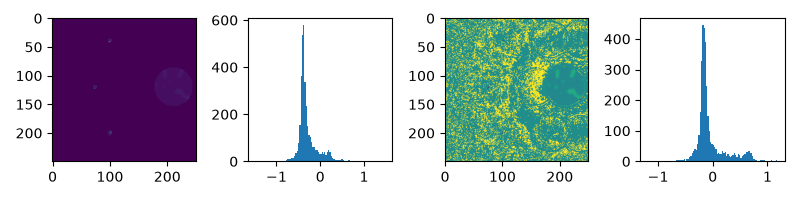

0j


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


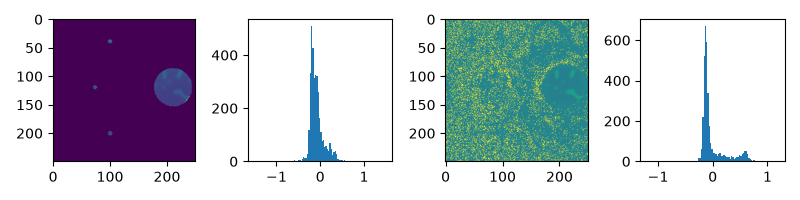

0j


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


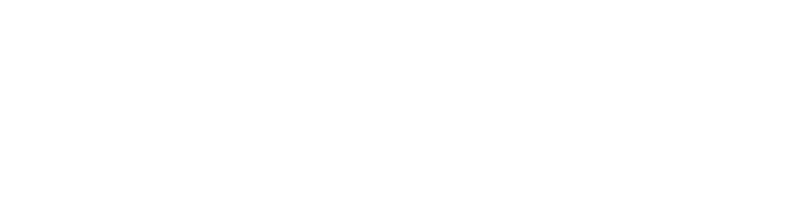

(-0+0j)


/tmp/ipykernel_9328/2480622865.py:97: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


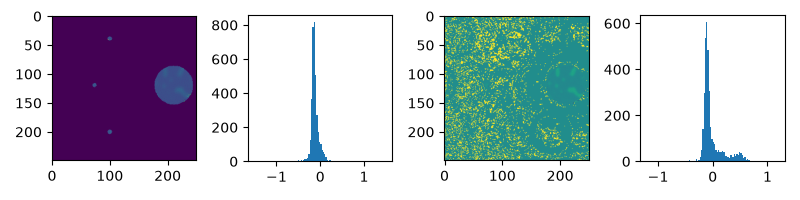

In [41]:
%matplotlib widget

plt.close("all")

    
A=[[],[],[],[],[],[],[],[],[],[],[],[],[],[]]
phi=[[],[],[],[],[],[],[],[],[],[],[],[],[],[]]
E=[]

ABS=[]
PHASE=[]
E=[]


reconp=[]
reconn=[]

figt,axt=plt.subplots(2,1)
recons= []  # for gifs
for yyyy in  range(len(AA)):
    
    im_id = AA[yyyy][0]
    topo_id = AA[yyyy][1]
    dark_id = AA[yyyy][2]
    
    
    # Load energy and add to experimental setup
    energy=load_key(im_id[0],mnemonics["energy"])
    experimental_setup["energy"] = load_key(im_id[0],mnemonics["energy"])
    experimental_setup["lambda"] = helper.photon_energy_wavelength(
        experimental_setup["energy"], input_unit="eV"
    )
    
    retrieved_p_pc=np.load("retrieved_p_pc_2_%d.npy"%im_id[0])
    retrieved_n_pc=np.load("retrieved_n_pc_2_%d.npy"%im_id[0])
    
    
    #prop_dist=0.2
    p_pc = cci.reconstruct(
        fth.propagate(
            retrieved_p_pc ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup))
    n_pc = cci.reconstruct(
        fth.propagate(
            retrieved_n_pc ,
            prop_dist * 1e-6,
            experimental_setup=experimental_setup))


    if binning==0:
        roi = np.s_[790+2: 865+2, 985-1: 1060-1]
    else:
        roi = np.s_[100:190,295:385]
        
    roi=np.s_[:,:]
    #roi=np.s_[284:294,444:454]
    
    mask2=scipy.ndimage.binary_erosion(supportmask[roi], iterations=6)
    recon= ((p_pc/n_pc)[::-1,::-1])
    recon_p= ((p_pc)[::-1,::-1])
    recon_n= ((n_pc)[::-1,::-1])
    
    reconp.append(recon_p)
    reconn.append(recon_n)

    mask2=supportmask[roi]
    recon=recon[roi]*mask2
    
    print(recon[3,5])
    axt[0].scatter(energy, np.abs(recon_p[3,5]), c="b")
    axt[0].scatter(energy, np.abs(recon_n[3,5]), c="r")
    
    axt[1].scatter(energy, np.angle(recon_p[3,5]), c="b")
    axt[1].scatter(energy, np.angle(recon_n[3,5]), c="r")
    
    #fig,ax=plt.subplots(1,2)
    #ax[0].imshow(np.abs(recon), vmin=0, vmax=4, cmap="gray")
    #ax[1].imshow(np.angle(recon), vmin=-np.pi, vmax=np.pi, cmap="gray")
    #plt.show()
    
    
    

    fig,ax=plt.subplots(1,4, figsize=(8,2))
    ax[0].imshow((np.abs(recon[250:500,350:600])))
    a_abs=ax[1].hist(np.log(np.abs(recon)[mask2!=0]).flatten(), bins=100, range=(-1.5,1.5))
    
    ax[2].imshow(np.angle(recon[250:500,350:600]), cmap="viridis")
    a_phase=ax[3].hist(np.angle(recon)[mask2!=0].flatten(), bins=100, range=(-1.2,1.2))
    
    ABS.append(a_abs[0])
    PHASE.append(a_phase[0])
    E.append(experimental_setup["energy"])
    
    
    fig.tight_layout()
    #ax[0,1].set_ylim(0,1000)
    #ax[1,1].set_ylim(0,1000)
    
    plt.show()
    

    
    #plt.close("all")


    

In [42]:
reconp=np.array(reconp)
reconn=np.array(reconn)

ABS=np.array(ABS)
PHASE=np.array(PHASE)
E=np.array(E)

In [43]:
fig,ax=plt.subplots()
ax.imshow(np.abs(reconp+reconn)[0,:,:], vmin=0., vmax=2)

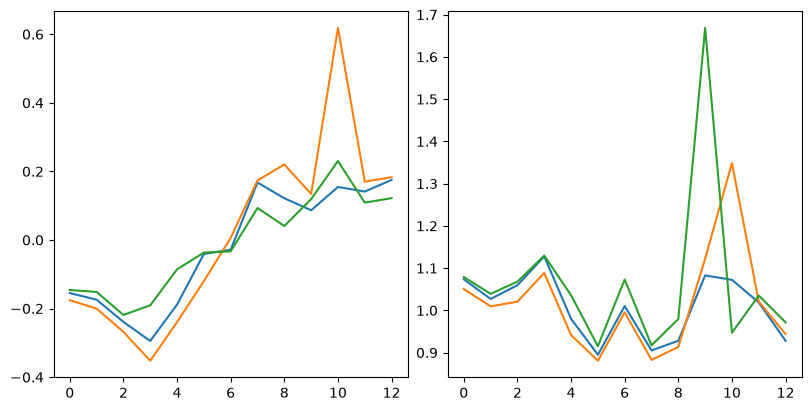

In [45]:
%matplotlib inline
plt.close("all")

roi=np.s_[:,360:373,418:427]
roi2=np.s_[:,280:293,444:454]
roi3=np.s_[:,442:454,444:454]

#fig,ax=plt.subplots()
#ax.plot( np.average( np.abs(reconp+reconn)[roi], axis=(1,2)))


fig,ax=plt.subplots(1,2, figsize=(8,4))
ax[0].plot( np.average( np.angle(reconp/reconn)[roi ], weights= np.abs(reconp+reconn)[roi ],  axis=(1,2)))
ax[0].plot( np.average( np.angle(reconp/reconn)[roi2], weights= np.abs(reconp+reconn)[roi2],  axis=(1,2)))
ax[0].plot( np.average( np.angle(reconp/reconn)[roi3], weights= np.abs(reconp+reconn)[roi3],  axis=(1,2)))

ax[1].plot( np.average( np.abs(reconp/reconn)[roi ], weights= np.abs(reconp+reconn)[roi ],  axis=(1,2)))
ax[1].plot( np.average( np.abs(reconp/reconn)[roi2], weights= np.abs(reconp+reconn)[roi2],  axis=(1,2)))
ax[1].plot( np.average( np.abs(reconp/reconn)[roi3], weights= np.abs(reconp+reconn)[roi3],  axis=(1,2)))

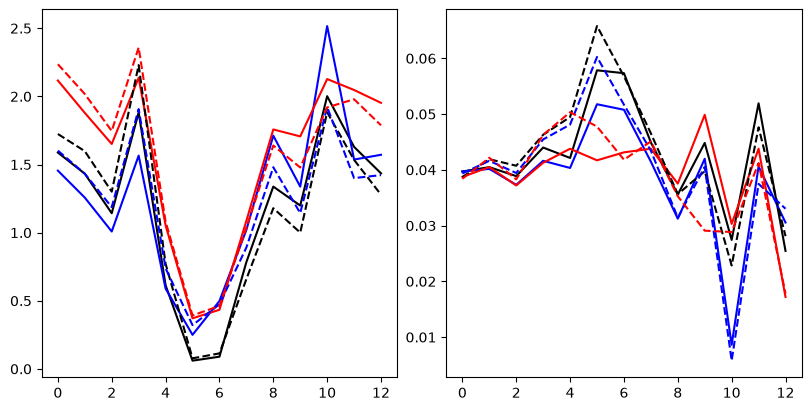

In [46]:
roi=np.s_[:,360:373,418:427]
roi2=np.s_[:,280:293,444:454]
roi3=np.s_[:,442:454,444:454]


#fig,ax=plt.subplots()
#ax.plot( np.average( np.abs(reconp+reconn)[roi], axis=(1,2)))

e=10
fig,ax=plt.subplots(1,2, figsize=(8,4))
ax[0].plot( np.average( np.angle(reconp)[roi ], weights= np.abs(reconp+reconn)[roi ]**e,  axis=(1,2)), c="k")
ax[0].plot( np.average( np.angle(reconp)[roi2], weights= np.abs(reconp+reconn)[roi2]**e,  axis=(1,2)), c="b")
ax[0].plot( np.average( np.angle(reconp)[roi3], weights= np.abs(reconp+reconn)[roi3]**e,  axis=(1,2)), c="r")
ax[0].plot( np.average( np.angle(reconn)[roi ], weights= np.abs(reconp+reconn)[roi ]**e,  axis=(1,2)), c="k", ls="--")
ax[0].plot( np.average( np.angle(reconn)[roi2], weights= np.abs(reconp+reconn)[roi2]**e,  axis=(1,2)), c="b", ls="--")
ax[0].plot( np.average( np.angle(reconn)[roi3], weights= np.abs(reconp+reconn)[roi3]**e,  axis=(1,2)), c="r", ls="--")

ax[1].plot( np.average( np.abs(reconp)[roi ], weights= np.abs(reconp+reconn)[roi ]**e,  axis=(1,2)), c="k")
ax[1].plot( np.average( np.abs(reconp)[roi2], weights= np.abs(reconp+reconn)[roi2]**e,  axis=(1,2)), c="b")
ax[1].plot( np.average( np.abs(reconp)[roi3], weights= np.abs(reconp+reconn)[roi3]**e,  axis=(1,2)), c="r")
ax[1].plot( np.average( np.abs(reconn)[roi ], weights= np.abs(reconp+reconn)[roi ]**e,  axis=(1,2)), c="k", ls="--")
ax[1].plot( np.average( np.abs(reconn)[roi2], weights= np.abs(reconp+reconn)[roi2]**e,  axis=(1,2)), c="b", ls="--")
ax[1].plot( np.average( np.abs(reconn)[roi3], weights= np.abs(reconp+reconn)[roi3]**e,  axis=(1,2)), c="r", ls="--")

In [47]:
phase=np.average( np.angle(reconp/reconn)[roi2 ], weights= np.abs(reconp+reconn)[roi2 ],  axis=(1,2))
absl=np.average( np.abs(reconp/reconn)[roi2 ], weights= np.abs(reconp+reconn)[roi2 ],  axis=(1,2))
#phase=phase*0
phasep=np.average( np.angle(reconp)[roi2 ], weights= np.abs(reconp+reconn)[roi2 ],  axis=(1,2))
phasen=np.average( np.angle(reconn)[roi2 ], weights= np.abs(reconp+reconn)[roi2 ],  axis=(1,2))

In [48]:
phase*0
absl*0
phasep*0
phasen*0

array([0., 0., 0., ..., 0., 0., 0.], shape=(13,))

In [49]:
plt.close("all")

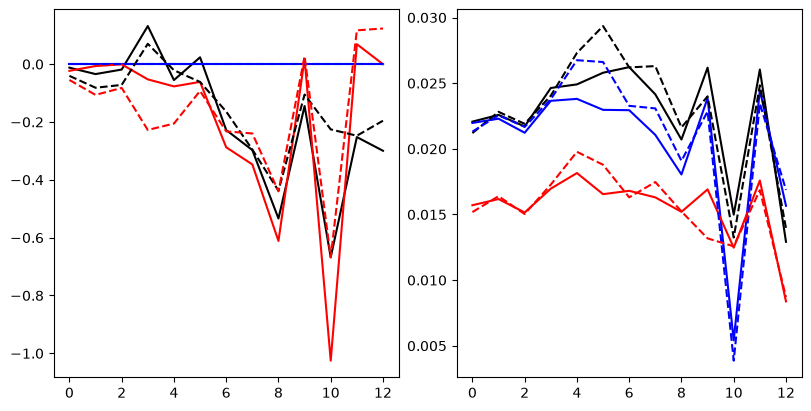

In [50]:
roi=np.s_[:,360:373,418:427]
roi2=np.s_[:,280:293,444:454]
roi3=np.s_[:,442:454,444:454]

#fig,ax=plt.subplots()
#ax.plot( np.average( np.abs(reconp+reconn)[roi], axis=(1,2)))


fig,ax=plt.subplots(1,2, figsize=(8,4))
ax[0].plot( np.average( np.angle(reconp)[roi ], weights= np.abs(reconp+reconn)[roi ],  axis=(1,2))-phasep, c="k")
ax[0].plot( np.average( np.angle(reconp)[roi2], weights= np.abs(reconp+reconn)[roi2],  axis=(1,2))-phasep, c="b")
ax[0].plot( np.average( np.angle(reconp)[roi3], weights= np.abs(reconp+reconn)[roi3],  axis=(1,2))-phasep, c="r")
ax[0].plot( np.average( np.angle(reconn)[roi ], weights= np.abs(reconp+reconn)[roi ],  axis=(1,2))-phasen, c="k", ls="--")
ax[0].plot( np.average( np.angle(reconn)[roi2], weights= np.abs(reconp+reconn)[roi2],  axis=(1,2))-phasen, c="b", ls="--")
ax[0].plot( np.average( np.angle(reconn)[roi3], weights= np.abs(reconp+reconn)[roi3],  axis=(1,2))-phasen, c="r", ls="--")

ax[1].plot( np.average( np.abs(reconp)[roi ], weights= np.abs(reconp+reconn)[roi ],  axis=(1,2)), c="k")
ax[1].plot( np.average( np.abs(reconp)[roi2], weights= np.abs(reconp+reconn)[roi2],  axis=(1,2)), c="b")
ax[1].plot( np.average( np.abs(reconp)[roi3], weights= np.abs(reconp+reconn)[roi3],  axis=(1,2)), c="r")
ax[1].plot( np.average( np.abs(reconn)[roi ], weights= np.abs(reconp+reconn)[roi ],  axis=(1,2)), c="k", ls="--")
ax[1].plot( np.average( np.abs(reconn)[roi2], weights= np.abs(reconp+reconn)[roi2],  axis=(1,2)), c="b", ls="--")
ax[1].plot( np.average( np.abs(reconn)[roi3], weights= np.abs(reconp+reconn)[roi3],  axis=(1,2)), c="r", ls="--")

In [51]:
for yyyy in  range(len(AA)):
    
    im_id = AA[yyyy][0]
    topo_id = AA[yyyy][1]
    dark_id = AA[yyyy][2]
    
    
    # Load energy and add to experimental setup
    energy=load_key(im_id[0],mnemonics["energy"])
    experimental_setup["energy"] = load_key(im_id[0],mnemonics["energy"])
    experimental_setup["lambda"] = helper.photon_energy_wavelength(
        experimental_setup["energy"], input_unit="eV"
    )
    print(energy,",")


774.0300210668508 ,
774.3329940840005 ,
774.697859550576 ,
775.0084627765841 ,
775.3274594445494 ,
775.6719341674561 ,
775.9790970441696 ,
776.3061066852565 ,
776.709481630756 ,
776.9978857988127 ,
777.3336209062874 ,
777.6568036032927 ,
777.9999199359407 ,


0j


/tmp/ipykernel_9328/2694803413.py:64: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


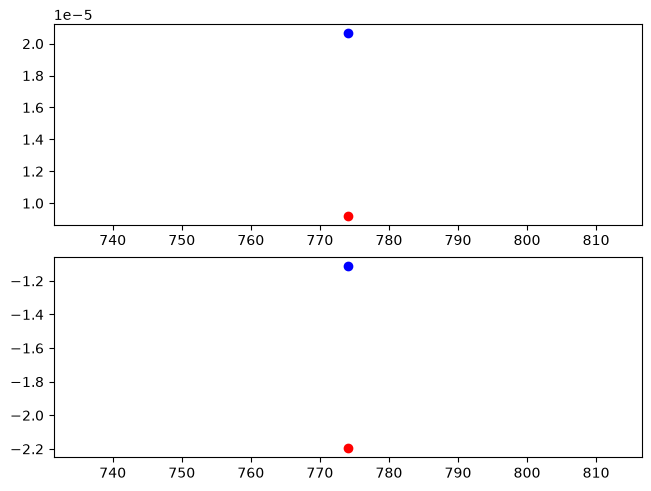

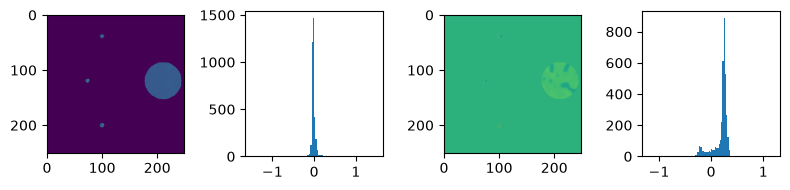

0j


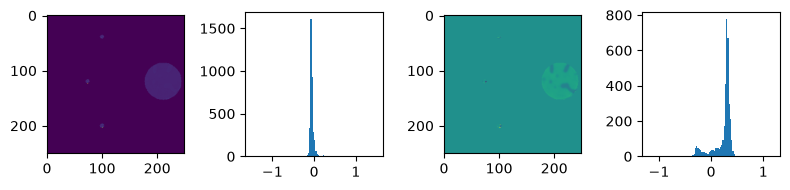

-0j


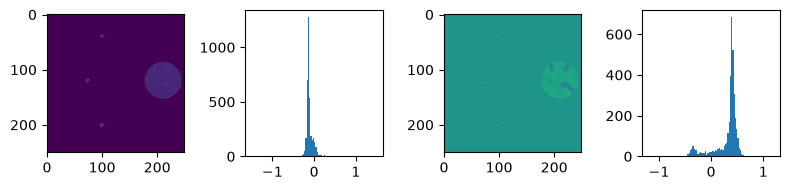

-0j


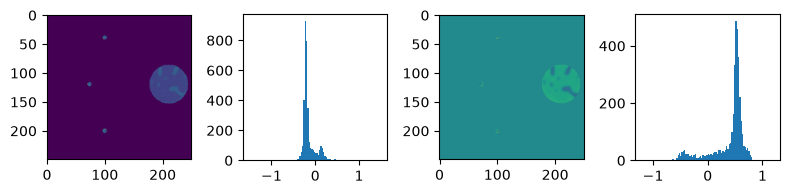

0j


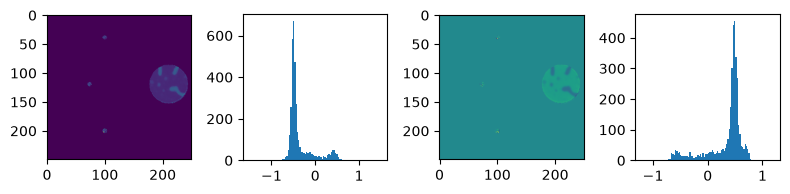

0j


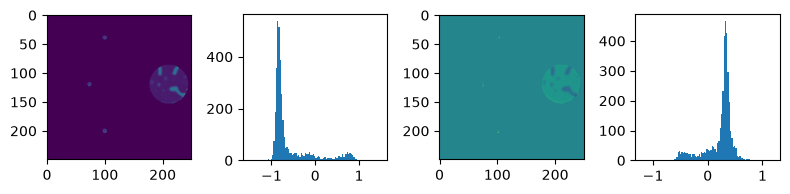

(-0+0j)


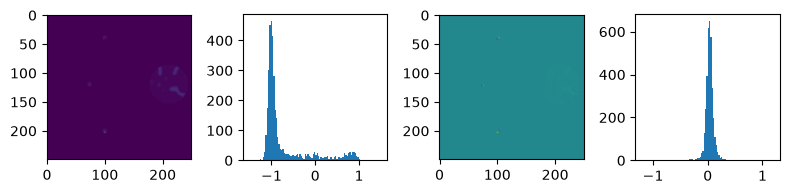

(-0+0j)


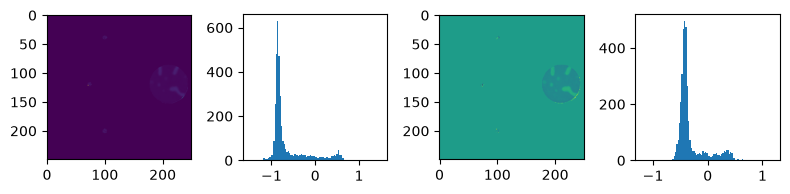

-0j


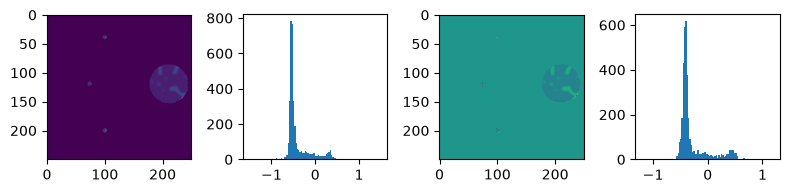

0j


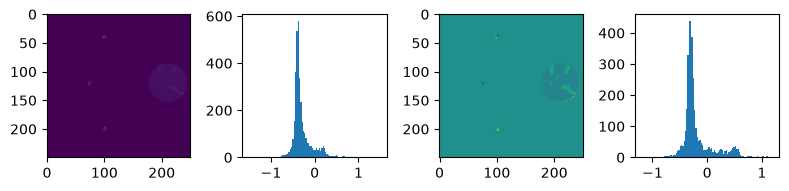

0j


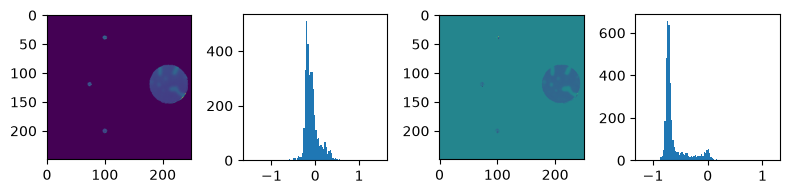

0j


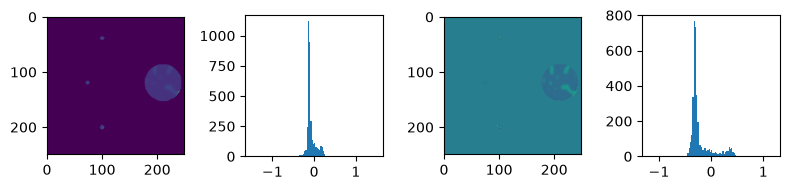

(-0+0j)


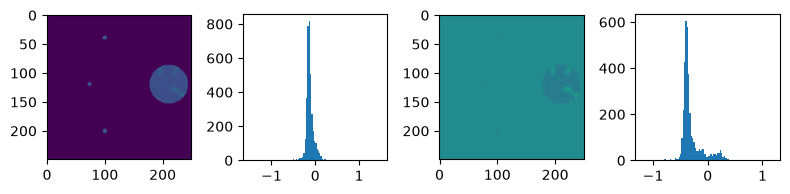

In [52]:
plt.close("all")
%matplotlib inline

    
A=[[],[],[],[],[],[],[],[],[],[],[],[],[],[]]
phi=[[],[],[],[],[],[],[],[],[],[],[],[],[],[]]
E=[]

ABS=[]
PHASE=[]
E=[]

figt,axt=plt.subplots(2,1)
recons= []  # for gifs
for yyyy in  range(len(AA)):
    
    im_id = AA[yyyy][0]
    topo_id = AA[yyyy][1]
    dark_id = AA[yyyy][2]
    
    
    # Load energy and add to experimental setup
    energy=load_key(im_id[0],mnemonics["energy"])
    experimental_setup["energy"] = load_key(im_id[0],mnemonics["energy"])
    experimental_setup["lambda"] = helper.photon_energy_wavelength(
        experimental_setup["energy"], input_unit="eV"
    )

    if binning==0:
        roi = np.s_[790+2: 865+2, 985-1: 1060-1]
    else:
        roi = np.s_[100:190,295:385]
        
    roi=np.s_[:,:]
    #roi=np.s_[284:294,444:454]
    
    mask2=scipy.ndimage.binary_erosion(supportmask[roi], iterations=6)
    
    recon_p= reconp[yyyy,:,:] * np.exp( -1j * phasep[yyyy] )
    recon_n= reconn[yyyy,:,:] * np.exp( -1j * phasen[yyyy] )
    recon= recon_p/recon_n#* np.exp( -1j * phase[yyyy] )# / absl[yyyy]
    
    mask2=supportmask[roi]
    recon=recon[roi]*mask2
    
    print(recon[3,5])
    axt[0].scatter(energy, np.abs(recon_p[3,5]), c="b")
    axt[0].scatter(energy, np.abs(recon_n[3,5]), c="r")
    
    axt[1].scatter(energy, np.angle(recon_p[3,5]), c="b")
    axt[1].scatter(energy, np.angle(recon_n[3,5]), c="r")

    fig,ax=plt.subplots(1,4, figsize=(8,2))
    ax[0].imshow((np.abs(recon[250:500,350:600])))
    a_abs=ax[1].hist(np.log(np.abs(recon)[mask2!=0]).flatten(), bins=100 , range=(-1.5,1.5))
    
    ax[2].imshow( (supportmask*np.angle(recon))[250:500,350:600] , cmap="viridis")
    a_phase=ax[3].hist((np.angle(recon))[mask2!=0].flatten(), bins=100 , range=(-1.2,1.2))
    
    ABS.append(a_abs[0])
    PHASE.append(a_phase[0])
    E.append(experimental_setup["energy"])
    
    fig.tight_layout()
    
    plt.show()

    

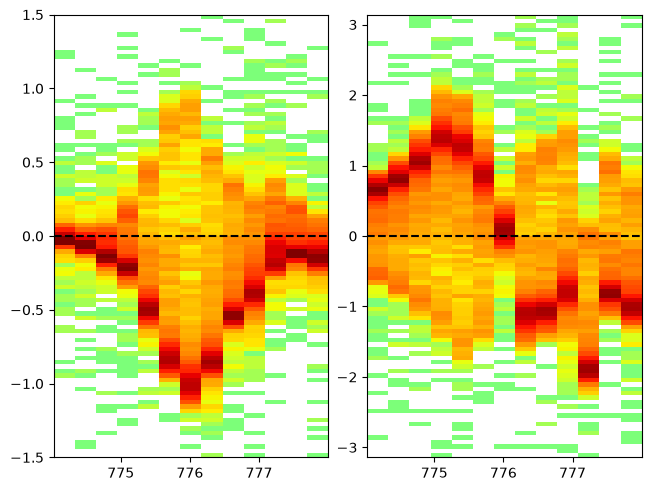

In [53]:
plt.close("all")


import matplotlib.colors as colors
    
fig,ax=plt.subplots(1,2)
ax[0].imshow(np.rot90(   ABS), aspect="auto", interpolation="none", norm=colors.LogNorm(vmin=1e-3, vmax=1e3), cmap="jet", extent=(np.amin(E), np.amax(E), -1.5,1.5))
ax[1].imshow(np.rot90( PHASE), aspect="auto", interpolation="none", norm=colors.LogNorm(vmin=1e-3, vmax=1e3), cmap="jet", extent=(np.amin(E), np.amax(E), -np.pi, np.pi))


ax[0].plot([np.amin(E), np.amax(E)],[0,0], ls="--", c="k")
ax[1].plot([np.amin(E), np.amax(E)],[0,0], ls="--", c="k")
plt.show()

In [54]:
for yyyy in range(10):
    reconp[yyyy,:,:]=reconp[yyyy,:,:]* np.exp( -1j * phasep[yyyy] )
    reconn[yyyy,:,:]=reconn[yyyy,:,:]* np.exp( -1j * phasen[yyyy] )
    
    
    

In [55]:
import matplotlib
matplotlib.rcParams.update({'font.size': 8})
matplotlib.rcParams['lines.linewidth'] = 1
matplotlib.rcParams['axes.linewidth'] = 0.5

SMALL_SIZE = 6
MEDIUM_SIZE = 6
BIGGER_SIZE = 7

plt.rc('font', size=SMALL_SIZE, family='sans-serif', weight="normal")          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=SMALL_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

plt.rcParams['figure.dpi'] = 240

plt.rc('text', usetex=False)
plt.rc('font', family="sans-serif")
plt.rc('text.latex', preamble=r'\usepackage{sfmath}')

In [56]:
plt.close("all")
%matplotlib widget

energies=[
774.0300210668508 ,
774.3329940840005 ,
774.697859550576 ,
775.0084627765841 ,
775.3274594445494 ,
775.6719341674561 ,
775.9790970441696 ,
776.3061066852565 ,
776.709481630756 ,
776.9978857988127 ,
777.3336209062874 ,
777.6568036032927 ,
777.9999199359407 ,
         ]

p0=np.array([287, 449])
p1=np.array([368, 422])
p2=np.array([449, 449])
d=np.sqrt(np.sum((p2-p0)**2))
dum=np.sqrt(288.633**2+4.262**2)/114.84
lpx=dum/d*1e3

A=[[],[],[],[],[],[],[],[],[],[],[],[],[],[]]
phi=[[],[],[],[],[],[],[],[],[],[],[],[],[],[]]
E=[]

ABS=[]
PHASE=[]
E=[]

figt,axt=plt.subplots(2,len(AA), figsize=(12.5/2.54,12.5/2.54/len(AA)*2))
ax=[0,0,0,0]
fig,((ax[0], ax[2]), (ax[1], ax[3]))  =plt.subplots( 2,2, figsize=(10/2.54,5/2.54))
#fig2,ax2  =plt.subplots(2,1, figsize=(10,4))


rois=np.s_[:,335:410-5,525:600-5]
avg=2
#ax[1].plot(energies,yy, c="red")
x0,y0=14,20
yy=+np.average( (np.angle(  reconp/reconn))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))
x0,y0=36,30
yy+=np.average( (np.angle(  reconp/reconn))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))
yy/=2

recon=reconp/reconn
for yyyy in  range(len(AA)):
    #print(recon)
    #recon[yyyy]=recon[yyyy]*np.exp(-1j * yy[yyyy] )
    #print(recon)
    print(yy[yyyy])
    
    
for i,yyyy in enumerate(list(range(len(AA)))):
    
    im_id = AA[yyyy][0]
    topo_id = AA[yyyy][1]
    dark_id = AA[yyyy][2]
    
    # Load energy and add to experimental setup
    energy=load_key(im_id[0],mnemonics["energy"])
    experimental_setup["energy"] = load_key(im_id[0],mnemonics["energy"])
    experimental_setup["lambda"] = helper.photon_energy_wavelength(
        experimental_setup["energy"], input_unit="eV"
    )

    if binning==0:
        roi = np.s_[790+2: 865+2, 985-1: 1060-1]
    else:
        roi = np.s_[100:190,295:385]
        
    roi=np.s_[:,:]
    #roi=np.s_[284:294,444:454]
    
    mask2=scipy.ndimage.binary_erosion(supportmask[roi], iterations=6)

    
    recon2= recon[yyyy,:,:] #* np.exp( -1j * phase[yyyy] )# / absl[yyyy]
    
    mask2=supportmask[roi]
    recon2=recon2[roi]*mask2
    recon2[supportmask==0]=np.nan
    rois=np.s_[335:410-5,525:600-5]
    
    #axt[0,i].text(0.5,1.1,"%0.1f eV"%energy, fontsize=5, transform=axt[0,i].transAxes , ha="center", va="center")
    imca=axt[0,i].imshow( (np.log(np.abs(  recon2)))[rois]/2 , cmap="gray", vmin=-0.7, vmax=0.7)
    imcp=axt[1,i].imshow( (np.angle(recon2))[rois]/2 , cmap="gray", vmin=-0.4, vmax=0.4)
    axt[0,i].axis("off")
    axt[1,i].axis("off")

    
rois=np.s_[:,335:410-5,525:600-5]


x0,y0=42,45

ax[0].plot(energies[:],np.average( np.log(np.abs(  recon))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))[:]/2, c="blue", ls="--", marker="o", markersize=3)
ax[1].plot(energies[:],np.average( (np.angle(  recon))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))[:]/2, c="blue", ls="--", marker="o", markersize=3)
axt[0,0].scatter(y0,x0, c="blue", marker="x", s=5)
axt[1,0].scatter(y0,x0, c="blue", marker="x", s=5)

x0,y0=36,57
x0,y0=54,45
ax[0].plot(energies[:],np.average( np.log(np.abs(  recon))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))[:]/2, c="red", ls="--", marker="o", markersize=3)
ax[1].plot(energies[:],np.average( (np.angle(  recon))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))[:]/2, c="red", ls="--", marker="o", markersize=3)
axt[0,0].scatter(y0,x0, c="red", marker="x", s=5)
axt[1,0].scatter(y0,x0, c="red", marker="x", s=5)  



ax[0].grid()
ax[1].grid()

ax[2].grid()
ax[3].grid()

ax[0].set_ylabel(r'$A_\text{XMCD}$')
ax[1].set_ylabel(r'$\phi_\text{XMCD}$')
ax[2].set_ylabel(r'$A_\text{XMCD}$')
ax[3].set_ylabel(r'$\phi_\text{XMCD}$')
ax[1].set_xlabel("Energy (eV)")
ax[3].set_xlabel("y (nm)")
ax[0].tick_params(labelbottom=False, top=True, right=True, direction="in")
ax[2].tick_params(labelbottom=False, top=True, right=True, direction="in")
ax[1].tick_params(labelbottom=True, top=True, right=True, direction="in")
ax[3].tick_params(labelbottom=True, top=True, right=True, direction="in")
ax[0].set_ylim(-0.7,0.7)
ax[1].set_ylim(-0.4,0.4)
ax[2].set_ylim(-0.7,0.7)
ax[3].set_ylim(-0.4,0.4)

#axt[0,0].text(-0.1,0.5,r'$A_\text{XMCD}$'   , rotation=90, transform=axt[0,0].transAxes , va="center", ha="center")
#axt[1,0].text(-0.1,0.5,r'$\phi_\text{XMCD}$', rotation=90, transform=axt[1,0].transAxes , va="center", ha="center")

x0s=[19,31,46,27,21]
y0s=[35,25,43,45,19]
l=10
for i in range(5):
    x0,y0=x0s[i],y0s[i]
    yyyy=6
    ax[2].plot(lpx*(np.arange(2*l)+y0-l/2)-200,np.log(np.abs(  recon))[rois][yyyy,y0-l:y0+l,x0]/2)
    axt[0,yyyy].plot([x0,x0],[y0-l,y0+l], ls="-", lw=0.5)
    
    yyyy=8
    ax[3].plot(lpx*(np.arange(2*l)+y0-l/2)-200,np.angle(  recon)[rois][yyyy,y0-l:y0+l,x0]/2)
    axt[1,yyyy].plot([x0,x0],[y0-l,y0+l], ls="-", lw=0.5)
    
cax=axt[0,12].inset_axes([1.1, 0, 0.075, 1])
figt.colorbar(imca, cax=cax)
cax.tick_params(labelsize=5)
#axt[0,12].set_ylabel(r'$A_\text{XMCD}$', labelpad=-2)
cax=axt[1,12].inset_axes([1.1, 0, 0.075, 1])
figt.colorbar(imcp, cax=cax)
cax.tick_params(labelsize=5)
#axt[1,12].set_ylabel(r'$\phi_\text{XMCD}$', labelpad=-2)

#fig.tight_layout()

from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
scalebar = AnchoredSizeBar(axt[0,0].transData,
                           int(500/lpx),"", loc='lower left', 
                           pad=0.15,
                           color='k',
                           frameon=False,
                           size_vertical=1)
scalebar.patch.set_edgecolor('none')
scalebar.patch.set_linewidth(0)
axt[0,0].add_artist(scalebar)
figt.savefig("Quantitative_imaging_00.pdf")
fig.savefig("Quantitative_imaging_01.pdf")


0.03423782279653388
0.040447717685389795
0.04731667926098959
0.0627398992144984
-0.03834723425597508
-0.035158163008582266
0.06534699333435193
-0.0422799439740332
0.006955199325212186
0.07032612613882644
0.20212507353890924
0.20427818049718127
0.1691379889826754


In [57]:
a=np.array([

( 0.143+0.5)/1.0 ,
( 0.111+0.2)/0.4 ,
(-0.068+0.5)/1.0 ,
(-0.014+0.2)/0.4 ,
(-0.107+0.5)/1.0 ,
(-0.023+0.2)/0.4
    
])
a, (1-a)*41/2

(array([0.643 , 0.7775, 0.432 , 0.465 , 0.393 , 0.4425], shape=(6,)),
 array([ 7.3185 ,  4.56125, 11.644  , 10.9675 , 12.4435 , 11.42875],
       shape=(6,)))

In [58]:
def f_fwhm(x, y):
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    imax = np.argmax(y)
    hm = y[imax] / 2.0

    # left crossing
    xl = None
    for i in range(imax-1, -1, -1):
        if y[i] <= hm <= y[i+1]:
            # linear interpolation between (x[i],y[i]) and (x[i+1],y[i+1])
            t = (hm - y[i])/(y[i+1]-y[i])
            xl = x[i] + t*(x[i+1]-x[i])
            break

    # right crossing
    xr = None
    for i in range(imax, len(y)-1):
        if y[i] >= hm >= y[i+1]:
            t = (hm - y[i])/(y[i+1]-y[i])
            xr = x[i] + t*(x[i+1]-x[i])
            break

    if xl is None or xr is None:
        raise ValueError("Could not find both half-maximum crossings.")
    return xr - xl, xl, xr, hm

In [59]:
fig,ax=plt.subplots()

x0,y0=42,45

yyy=np.average( np.log(np.abs(  recon))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))[:]/2
ymax=np.amax(yyy)
ax.plot(energies[:],yyy, c="blue", ls="--", marker="o", markersize=3)
x,y=energies.copy(),yyy.copy()
fwhm=f_fwhm(x, y)
ax.plot([fwhm[1],fwhm[2]],[fwhm[3],fwhm[3]])
print(fwhm)

x0,y0=54,45
yyy=-np.average( np.log(np.abs(  recon))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))[:]/2
ymax=np.amax(yyy)
ax.plot(energies[:],yyy, c="red", ls="--", marker="o", markersize=3)

x,y=energies.copy(),yyy.copy()
fwhm=f_fwhm(x, y)
ax.plot([fwhm[1],fwhm[2]],[fwhm[3],fwhm[3]])
print(fwhm)

(np.float64(1.1781089108275182), np.float64(775.3236558696334), np.float64(776.5017647804609), np.float64(0.21413640233929315))
(np.float64(1.4335319369413355), np.float64(775.3356028001361), np.float64(776.7691347370775), np.float64(0.25751149204764257))


In [60]:
(1.178183151711437+1.4334639159021663)/2,(1.178183151711437-1.4334639159021663)/2

(1.3058235338068016, -0.12764038209536466)

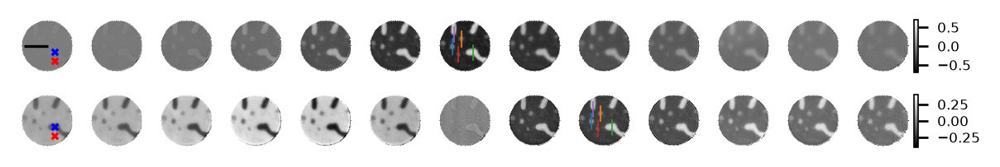

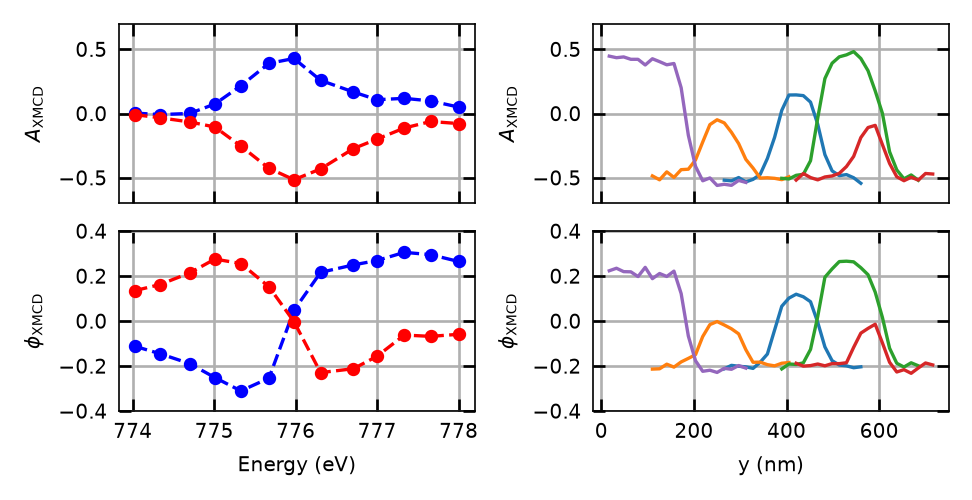

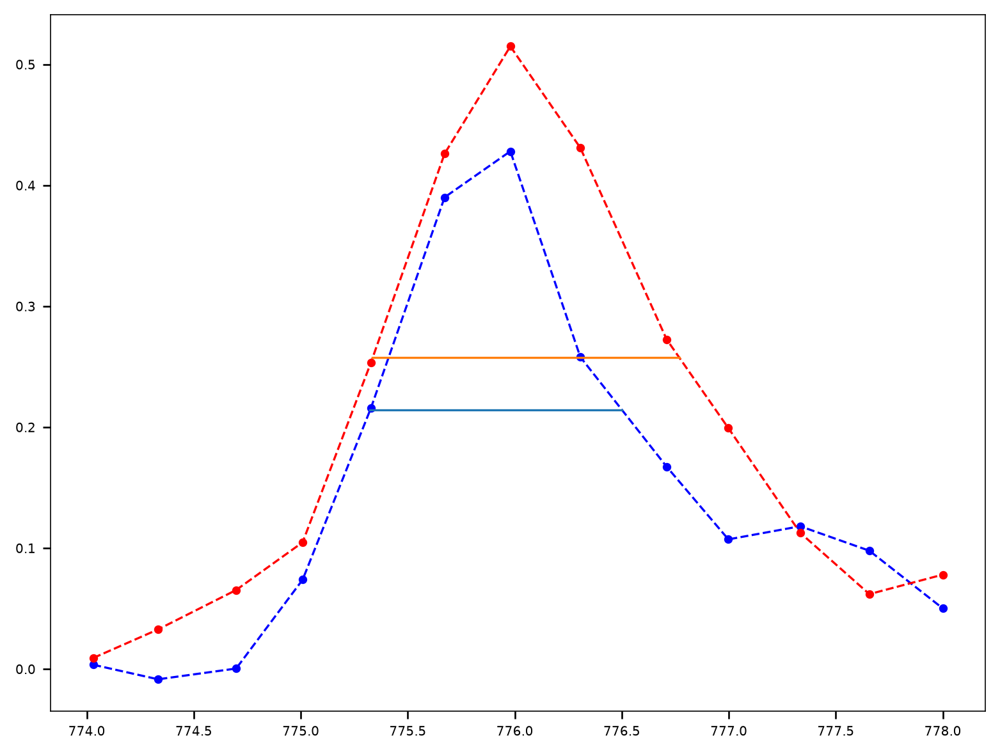

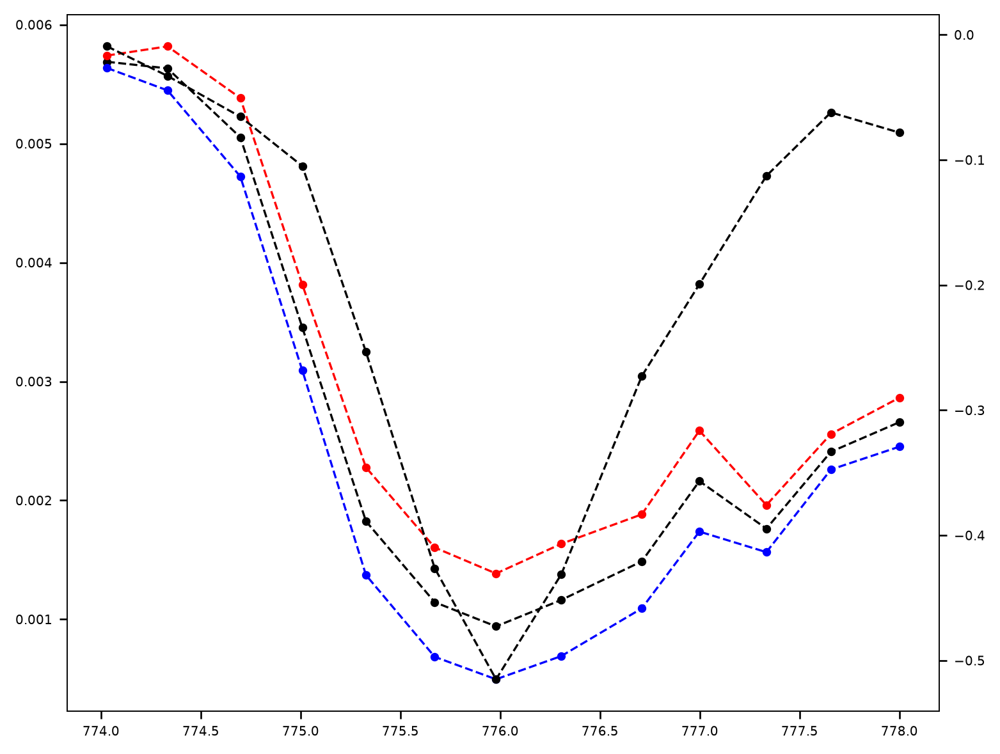

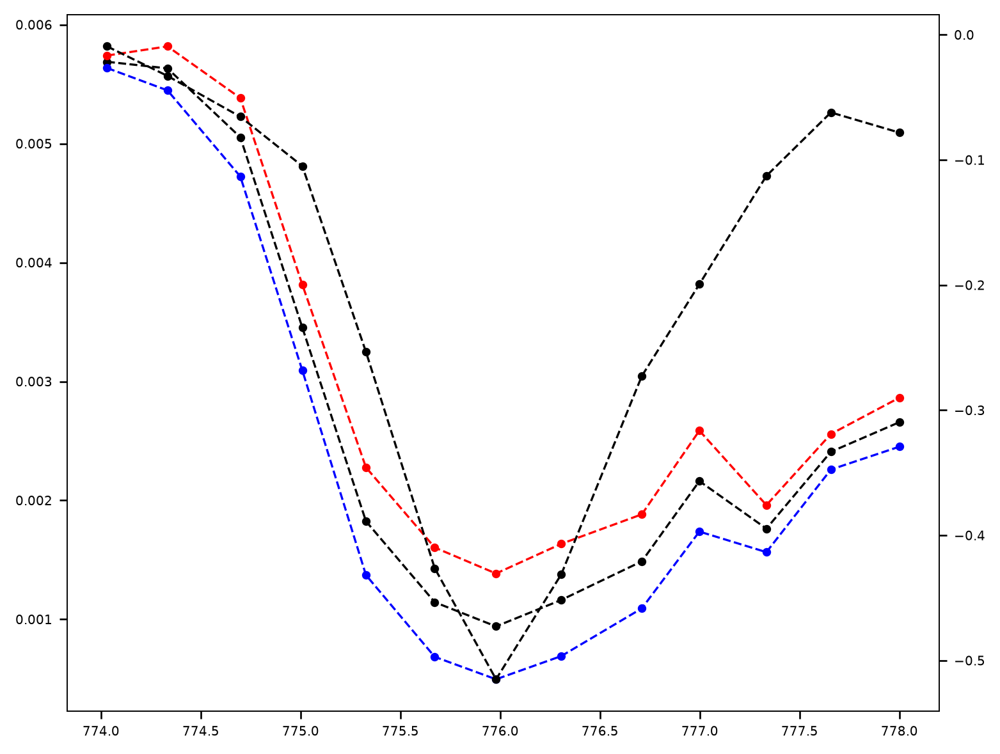

In [62]:
%matplotlib inline

x0,y0=42,45
x0,y0=54,45





fig,ax=plt.subplots()
ax2=ax.twinx()
ax2.plot(energies[:],np.average( np.log(np.abs(  reconp/reconn))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))[:]/2, c="k", ls="--", marker="o", markersize=3)
ax.plot(energies[:],np.average( (np.abs(  reconp)/2 + np.abs(  reconn)/2)[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))[:]/2, c="k", ls="--", marker="o", markersize=3)
ax.plot(energies[:],np.average( (np.abs(  reconp))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))[:]/2, c="blue", ls="--", marker="o", markersize=3)
ax.plot(energies[:],np.average( (np.abs(  reconn))[rois][:,x0-avg:x0+avg,y0-avg:y0+avg], axis=(1,2))[:]/2, c="red", ls="--", marker="o", markersize=3)

In [63]:
p0=np.array([287, 449])
p1=np.array([368, 422])
p2=np.array([449, 449])
d=np.sqrt(np.sum((p2-p0)**2))
dum=np.sqrt(288.633**2+4.262**2)/114.84
lpx=dum/d*1e3

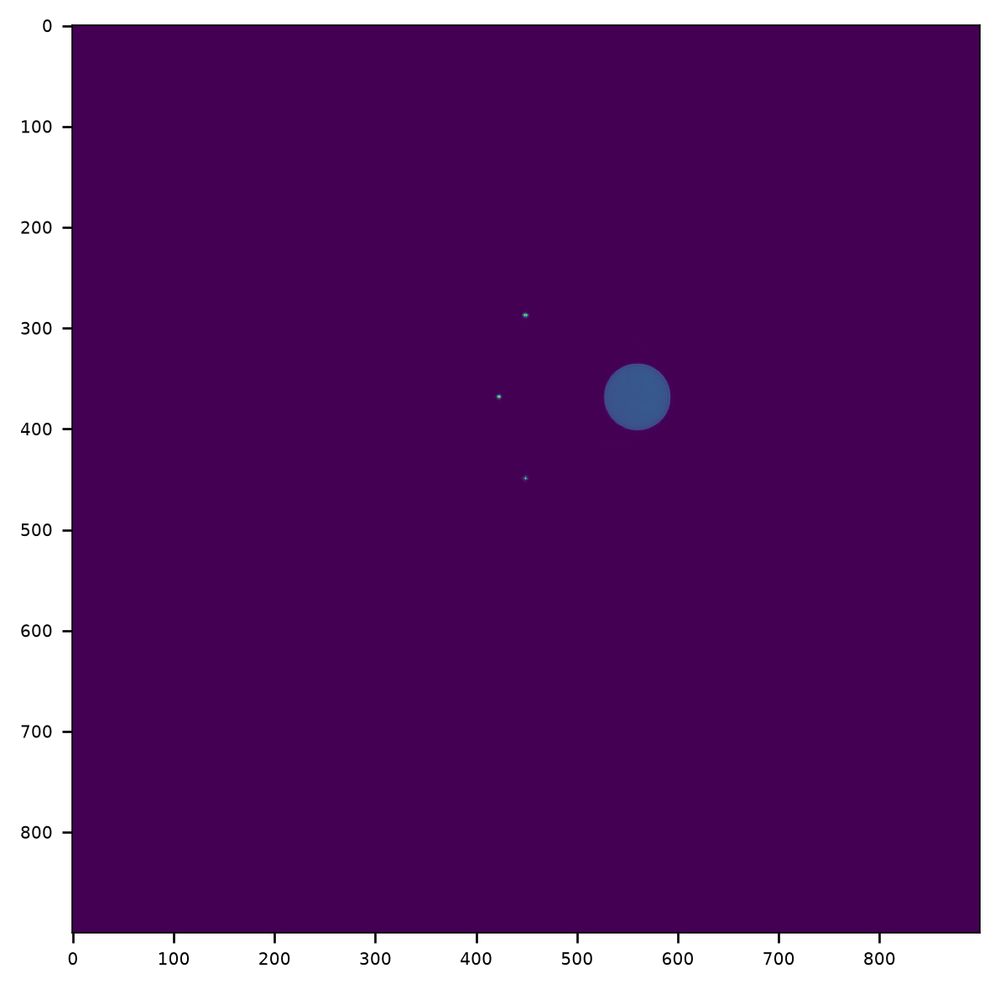

In [64]:
fig,ax=plt.subplots()
ax.imshow(np.abs(reconp[0]))

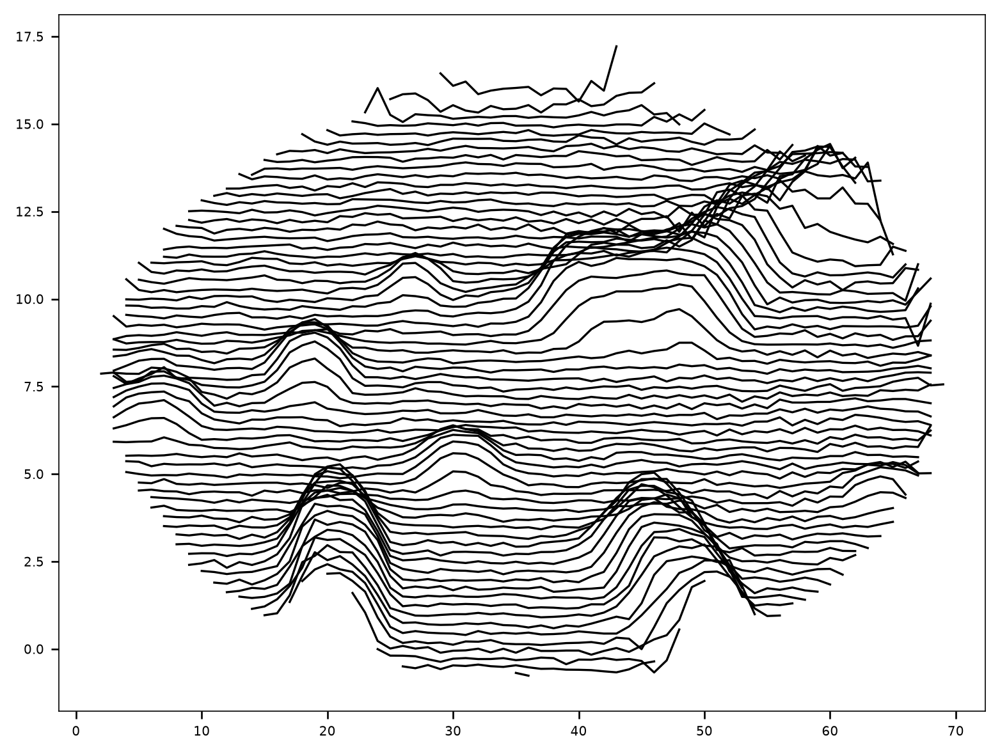

In [65]:
yyyy=6
plt.close("all")
fig,ax=plt.subplots()


for i in range(70):
    recon2=recon[yyyy]
    recon2[supportmask==0]=np.nan
    rois=np.s_[335:410-5,525:600-5]
    recon2=recon2[rois]
    ax.plot((np.log(np.abs(  recon2)))[i,:]+i*0.25, c="k")

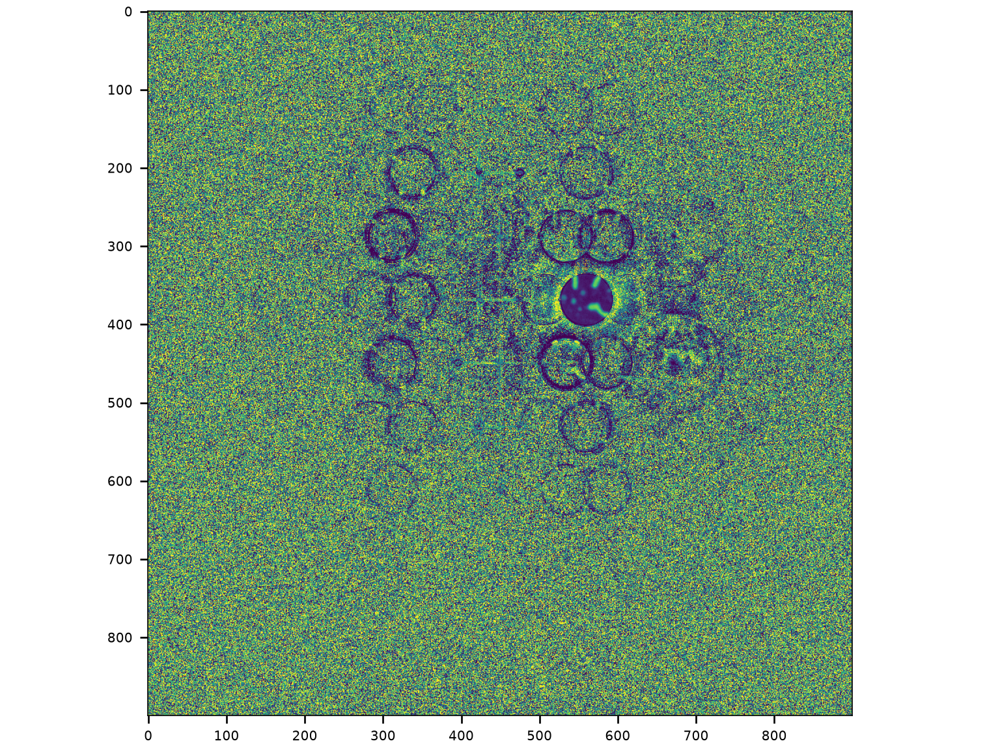

In [66]:
i=7

plt.close("all")
%matplotlib widget

fig,ax=plt.subplots()
ax.imshow(np.log(np.abs(reconp[i]/reconn[i])), vmin=-1, vmax=1)
plt.show()

<>:26: SyntaxWarning: invalid escape sequence '\P'
<>:29: SyntaxWarning: invalid escape sequence '\p'
<>:31: SyntaxWarning: invalid escape sequence '\p'
<>:31: SyntaxWarning: invalid escape sequence '\p'
<>:34: SyntaxWarning: invalid escape sequence '\p'
<>:34: SyntaxWarning: invalid escape sequence '\p'
<>:26: SyntaxWarning: invalid escape sequence '\P'
<>:29: SyntaxWarning: invalid escape sequence '\p'
<>:31: SyntaxWarning: invalid escape sequence '\p'
<>:31: SyntaxWarning: invalid escape sequence '\p'
<>:34: SyntaxWarning: invalid escape sequence '\p'
<>:34: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipykernel_9328/1718479928.py:26: SyntaxWarning: invalid escape sequence '\P'
  ax2.set_title("$\Psi_+/\Psi_-$ = A$e^{i\phi}$")
/tmp/ipykernel_9328/1718479928.py:29: SyntaxWarning: invalid escape sequence '\p'
  ax3.set_ylabel("$\phi$ : phase", color="r")
/tmp/ipykernel_9328/1718479928.py:31: SyntaxWarning: invalid escape sequence '\p'
  ax3.set_yticklabels(['$-\pi/16$',0,'$\pi/16$

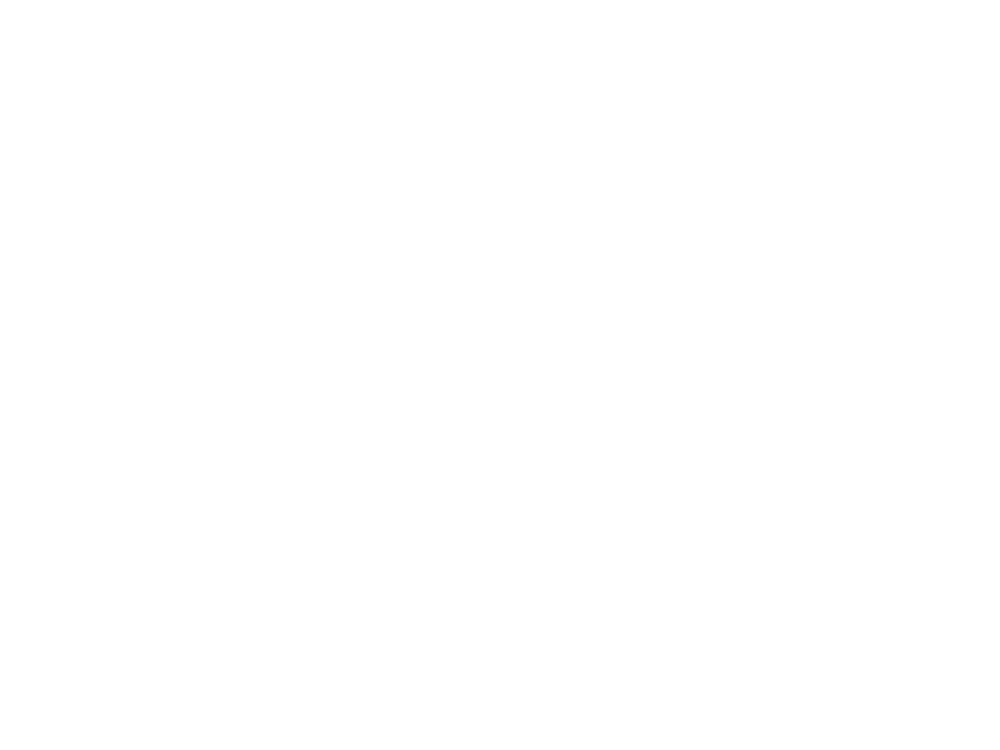

In [67]:
fig2,(ax2, ax3)=plt.subplots(1,2)
#ax3=ax2.twinx()
ax2.grid()

ax2.plot(E, np.log(A[0]), ".--", markersize=20,c='k')
ax3.plot(E,phi[0],".--", markersize=20,c='r')

ax2.plot(E, np.log(A[1]), ".-", markersize=5,c='k')
ax3.plot(E,phi[1],".-", markersize=5,c='r')

ax2.plot(E, np.log(A[2]), ".-", markersize=5,c='gray')
ax3.plot(E,phi[2],".-", markersize=5,c='orange')



ax2.plot(E, np.log(A[7]), ".-", markersize=5,c='k')
ax3.plot(E,phi[7],".--", markersize=5,c='r')

ax2.plot(E, np.log(A[8]), ".-", markersize=5,c='gray')
ax3.plot(E,phi[8],".--", markersize=5,c='orange')

ax2.plot(E, np.log(A[9]), ".-", markersize=5,c='pink')
ax3.plot(E,phi[9],".--", markersize=5,c='pink')


ax2.set_title("$\Psi_+/\Psi_-$ = A$e^{i\phi}$")
ax2.set_xlabel("E (eV)")
ax2.set_ylabel("A : absolute value", color="k")
ax3.set_ylabel("$\phi$ : phase", color="r")
ax3.set_yticks([-np.pi/16,0,np.pi/16])
ax3.set_yticklabels(['$-\pi/16$',0,'$\pi/16$'])

ax3.set_yticks([-np.pi/4,0,np.pi/4])
ax3.set_yticklabels(['$-\pi/4$',0,'$\pi/4$'])

fig2.savefig("A_phi_vs_E.png")

plt.show()

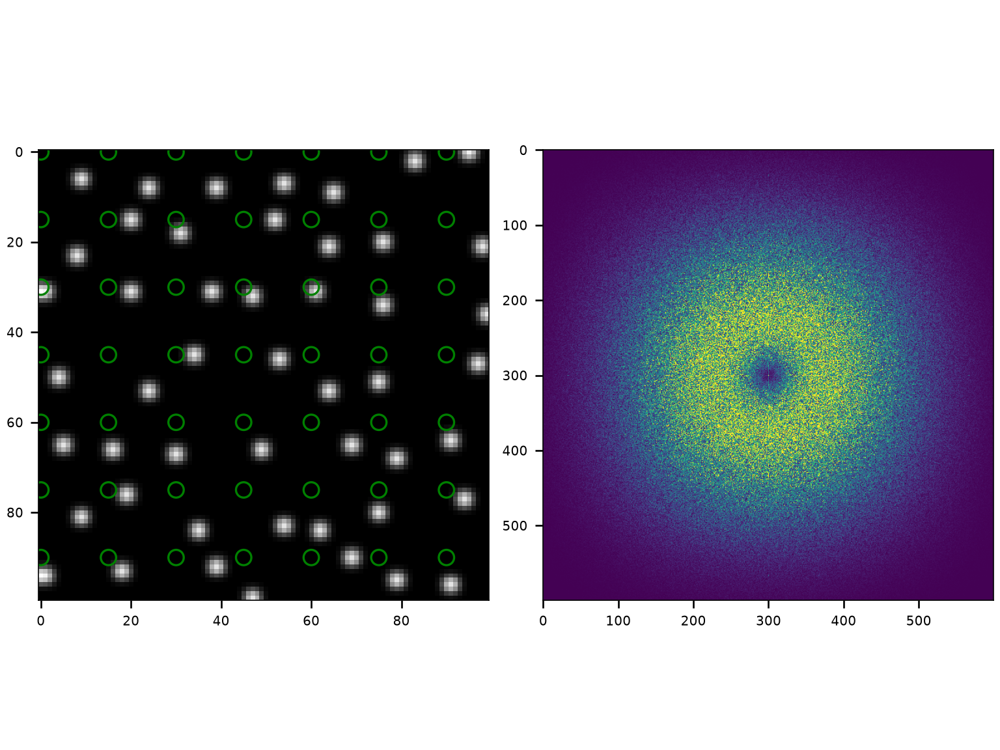

In [68]:
import numpy
import matplotlib.pyplot as plt
from skimage.draw import disk


M=np.ones((1000,1000))
r=10
for i in range(100):
    for j in range(100):
        x0,y0 = i*15+np.floor(np.random.rand()*r), j*15+np.floor(np.random.rand()*r)
        xx,yy=disk((x0,y0), 2)
        try:
            M[xx,yy]=-1
        except:
            pass

M=scipy.ndimage.gaussian_filter(M, 1.)
M2=M.copy()

if False:
    M+=np.roll(M2, shift=1)

    M+=np.roll(M2, shift=2)

    M+=np.roll(M2, shift=3)

    M+=np.roll(M2, shift=4)
#M+=np.roll(M2, shift=6)
    


fig,ax=plt.subplots(1,2)
ax[0].imshow(M[:100,:100], cmap="binary")
ii,jj=np.arange(0,100,15),np.arange(0,100,15)
ii,jj=np.meshgrid(ii,jj)
ax[0].scatter(ii,jj, s=50,marker="o", color="none", edgecolor="green")
fft=(np.abs(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(1+M)))))
mi,ma=np.percentile(fft, (1,99))
ax[1].imshow(fft[200:-200,200:-200], vmin=mi, vmax=ma)


plt.show()

In [ ]:
KuRT:= Ku0 * ( 1 - b*(300)/Tc ) * pow( 1- pow(((300)/Tc),expMs) ,expKu) / t_layer *f -2e-7* pi * Ms0 * ( 1 -  pow(((300)/Tc),expMs)) * Ms0 * ( 1 -  pow(((300)/Tc),expMs)) *( f - f * f )




In [202]:
phi=np.array(phi)
A=np.array(A)

In [203]:
fig2,(ax2, ax3)=plt.subplots(1,2)
#ax3=ax2.twinx()
ax2.grid()


i=1
ax2.plot(E, np.log(A[i]), ".-", markersize=20,c='k')
ax3.plot(E,phi[i]-phi[8],".-", markersize=20,c='r')

i=2
ax2.plot(E,np.log(A[i]), ".--", markersize=20,c='k')
ax3.plot(E,phi[i]-phi[8],".--", markersize=20,c='r')

ax2.set_title("$\Psi_+/\Psi_-$ = A$e^{i\phi}$")
ax2.set_xlabel("E (eV)")
ax2.set_ylabel("A : absolute value", color="k")
ax3.set_ylabel("$\phi$ : phase", color="r")
ax3.set_yticks([-np.pi/16,0,np.pi/16])
ax3.set_yticklabels(['$-\pi/16$',0,'$\pi/16$'])

ax3.set_yticks([-np.pi/4,0,np.pi/4])
ax3.set_yticklabels(['$-\pi/4$',0,'$\pi/4$'])

fig2.savefig("A_phi_vs_E.png")

plt.show()

ValueError: x and y must have same first dimension, but have shapes (20,) and (10,)

<>:12: SyntaxWarning: invalid escape sequence '\P'
<>:15: SyntaxWarning: invalid escape sequence '\p'
<>:17: SyntaxWarning: invalid escape sequence '\p'
<>:17: SyntaxWarning: invalid escape sequence '\p'
<>:20: SyntaxWarning: invalid escape sequence '\p'
<>:20: SyntaxWarning: invalid escape sequence '\p'
<>:12: SyntaxWarning: invalid escape sequence '\P'
<>:15: SyntaxWarning: invalid escape sequence '\p'
<>:17: SyntaxWarning: invalid escape sequence '\p'
<>:17: SyntaxWarning: invalid escape sequence '\p'
<>:20: SyntaxWarning: invalid escape sequence '\p'
<>:20: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipykernel_9328/355070994.py:12: SyntaxWarning: invalid escape sequence '\P'
  ax2.set_title("$\Psi_+/\Psi_-$ = A$e^{i\phi}$")
/tmp/ipykernel_9328/355070994.py:15: SyntaxWarning: invalid escape sequence '\p'
  ax3.set_ylabel("$\phi$ : phase", color="r")
/tmp/ipykernel_9328/355070994.py:17: SyntaxWarning: invalid escape sequence '\p'
  ax3.set_yticklabels(['$-\pi/16$',0,'$\pi/16$'])

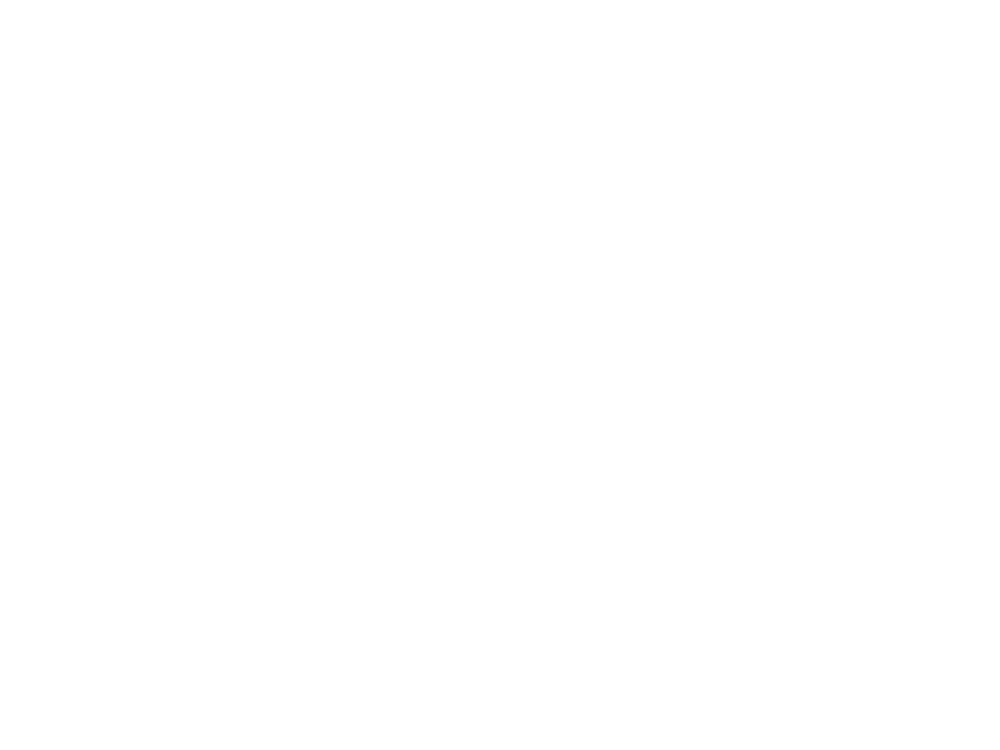

In [69]:
fig2,(ax2, ax3)=plt.subplots(1,2)
#ax3=ax2.twinx()
ax2.grid()


i=1
j=2
ax2.plot(E, -(  np.log(A[i])-np.log(A[j]) )/2, ".--", markersize=20,c='k')
ax3.plot(E, ( np.array(phi[i])-np.array(phi[j]) )/2,".--", markersize=20,c='r')


ax2.set_title("$\Psi_+/\Psi_-$ = A$e^{i\phi}$")
ax2.set_xlabel("E (eV)")
ax2.set_ylabel("A : absolute value", color="k")
ax3.set_ylabel("$\phi$ : phase", color="r")
ax3.set_yticks([-np.pi/16,0,np.pi/16])
ax3.set_yticklabels(['$-\pi/16$',0,'$\pi/16$'])

ax3.set_yticks([-np.pi/8,0,np.pi/8])
ax3.set_yticklabels(['$-\pi/8$',0,'$\pi/8$'])

fig2.savefig("A_phi_vs_E.png")

plt.show()

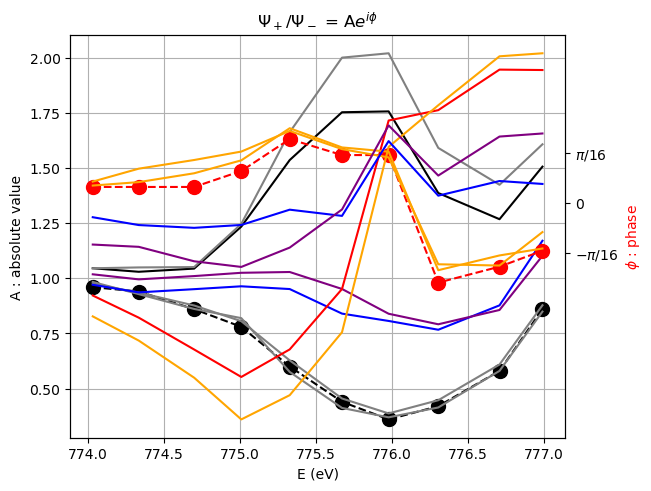

In [56]:
fig2,ax2=plt.subplots()
ax3=ax2.twinx()
ax2.grid()

ax2.plot(E, A[0], ".--", markersize=20,c='k')
ax3.plot(E,phi[0],".--", markersize=20,c='r')

ax2.plot(E, A[1], "-", markersize=0,c='k')
ax3.plot(E,phi[1],"-", markersize=0,c='r')

ax2.plot(E, A[2], "-", markersize=0,c='gray')
ax3.plot(E,phi[2],"-", markersize=0,c='orange')

ax2.plot(E, A[3], "-", markersize=0,c='gray')
ax3.plot(E,phi[3],"-", markersize=0,c='orange')

ax2.plot(E, A[4], "-", markersize=0,c='gray')
ax3.plot(E,phi[4],"-", markersize=0,c='orange')


ax2.plot(E, A[5], "-", markersize=0,c='blue')
ax3.plot(E,phi[5],"-", markersize=0,c='blue')


ax2.plot(E, A[6], "-", markersize=0,c='purple')
ax3.plot(E,phi[6],"-", markersize=0,c='purple')


ax2.set_title("$\Psi_+/\Psi_-$ = A$e^{i\phi}$")
ax2.set_xlabel("E (eV)")
ax2.set_ylabel("A : absolute value", color="k")
ax3.set_ylabel("$\phi$ : phase", color="r")
ax3.set_yticks([-np.pi/16,0,np.pi/16])
ax3.set_yticklabels(['$-\pi/16$',0,'$\pi/16$'])
fig2.savefig("A_phi_vs_E.png")

plt.show()

[1162]

In [110]:
%matplotlib widget

interactive(children=(FloatSlider(value=0.2, description='propagation[um]', layout=Layout(width='90%'), max=2.…

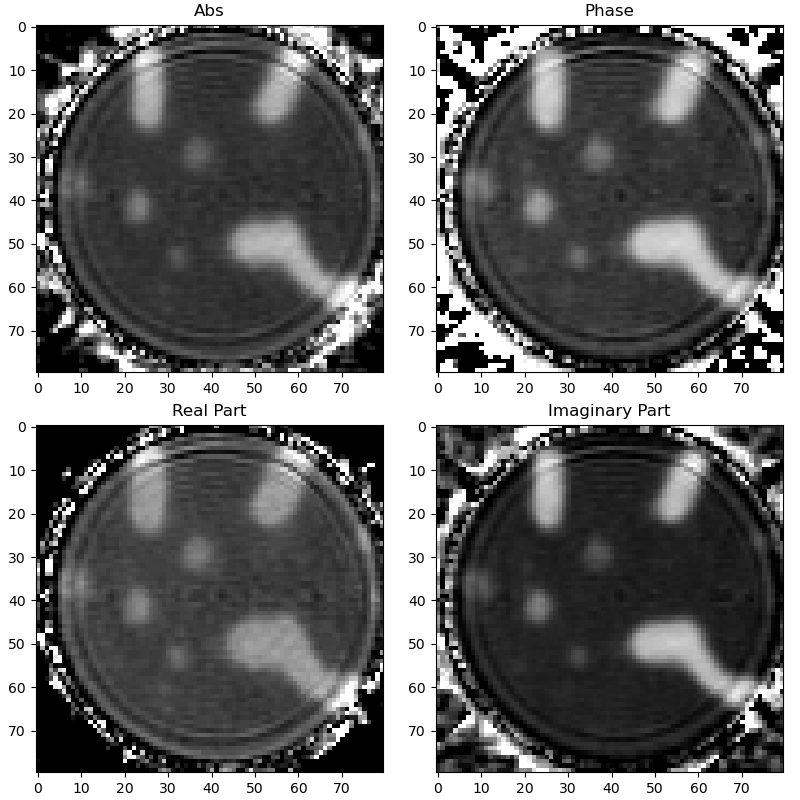

In [111]:
mode="/"
roi = np.s_[895-2: 975-2, 1110-1: 1190-1]

slider_prop,slider_phase, slider_dx, slider_dy = rec.focusCDI(retrieved_p_pc,retrieved_n_pc, roi, mask=scipy.ndimage.binary_erosion(supportmask, iterations=4),prop_dist=prop_dist,
                                                                           phase=phase,dx=0,dy=0, experimental_setup=experimental_setup,
                                                              operation=mode, max_prop_dist=2)

## Reconstruct images from phase retrieval

In [ ]:
# New beamstop for CDI recos as phase retrieval of low-q might be insufficient. If phase retrieval worked well
# Try without beamstop: `use_bs = False`
use_bs = False
bs_diam_cdi = 25  # diameter of beamstop


# Create beamstop
if use_bs is True:
    mask_bs_cdi = 1 - cci.circle_mask(
        topo.shape, np.array(topo.shape) / 2, bs_diam_cdi, sigma=4
    )
    mask_bs_cdi = 1 - mask_pixel_smooth.copy()
elif use_bs is False:
    mask_bs_cdi = np.ones(pos.shape)  # if you don't want a beamstop

# Get Recos partial coherence
# Positiv partial coherence
p_pc = cci.reconstruct(
    fth.propagate(
        retrieved_p_pc * mask_bs_cdi,
        prop_dist_cdi * 1e-6,
        experimental_setup=experimental_setup,
    )
)

# Negative partial coherence
n_pc = cci.reconstruct(
    fth.propagate(
        retrieved_n_pc * mask_bs_cdi,
        prop_dist_cdi * 1e-6,
        experimental_setup=experimental_setup,
    )
)

# Plotting
mode = "/"
print("Fine-tuning of reconstruction parameter:")
slider_prop, slider_phase, slider_dx, slider_dy = rec.focusCDI(
    retrieved_p_pc * mask_bs_cdi,
    retrieved_n_pc * mask_bs_cdi,
    roi_cdi_s,
    mask=supportmask,
    phase=phase_cdi,
    dx=dx,
    dy=dy,
    prop_dist=prop_dist_cdi,
    experimental_setup=experimental_setup,
    operation=mode,
    max_prop_dist=3,
    scale=(2, 98),
)

In [ ]:
# Get phase from slider
phase_cdi = slider_phase.value
prop_dist_cdi = slider_prop.value

# Reconstruct images with new parameter
p_pc = fth.reconstructCDI(
    fth.propagate(
        retrieved_p_pc * mask_bs_cdi,
        prop_dist_cdi * 1e-6,
        experimental_setup=experimental_setup,
    )
) * np.exp(1j * phase_cdi)

n_pc = fth.reconstructCDI(
    fth.propagate(
        retrieved_n_pc * mask_bs_cdi,
        prop_dist_cdi * 1e-6,
        experimental_setup=experimental_setup,
    )
) * np.exp(1j * phase_cdi)


print("Phase CDI: %s" % phase_cdi)
print("Prop_dist: %s" % prop_dist_cdi)

In [ ]:
# Confirm that offset subtraction in cdi function works, i.e., only small fraction of hologram is actually masked
fig, ax = plt.subplots(2, 2, figsize=(8, 8), sharex=True, sharey=True)
tmp = np.abs(retrieved_p_pc*mask_bs_cdi)
mi, ma = np.percentile(tmp, [0.1, 99.9])
ax[0, 0].imshow(tmp, vmin=mi, vmax=ma)
ax[0, 0].set_title("Pos holo")

tmp = np.abs(retrieved_n_pc)
mi, ma = np.percentile(tmp, [0.1, 99.9])
ax[0, 1].imshow(tmp, vmin=mi, vmax=ma)
ax[0, 1].set_title("Neg holo")
ax[1, 0].imshow(bsmask_p)
ax[1, 0].set_title("Pos holo mask")
ax[1, 1].imshow(bsmask_n)
ax[1, 1].set_title("Neg holo mask")

In [ ]:
cimshow(helper.log_clip(np.abs(retrieved_n_pc)))

## Save reconstructions

In [ ]:
def plot_recon(recon, title,scale_mask = None):
    if scale_mask is None:
        scale_mask = np.ones(recon.shape)
    
    # Plot
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    fig.suptitle(title)

    tmp = np.real(recon)*scale_mask
    vmin, vmax = np.nanpercentile(tmp[tmp!=0], (1, 99))
    t_im1 = ax[0].imshow(np.real(recon), vmin=vmin, vmax=vmax, cmap="gray")
    ax[0].set_title("Real")
    plt.colorbar(t_im1, ax=ax[0], aspect=50)

    tmp = np.imag(recon)*scale_mask
    vmin, vmax = np.nanpercentile(tmp[tmp!=0], (1, 99))
    t_im2 = ax[1].imshow(np.imag(recon), vmin=vmin, vmax=vmax, cmap="gray")
    ax[1].set_title("Imag")
    plt.colorbar(t_im2, ax=ax[1], aspect=50)


In [ ]:
# Reconstruct images with new parameter
p_pc = fth.reconstructCDI(
    fth.propagate(
        retrieved_p_pc * mask_bs_cdi,
        prop_dist_cdi * 1e-6,
        experimental_setup=experimental_setup,
    )
) * np.exp(1j * phase_cdi)

n_pc = fth.reconstructCDI(
    fth.propagate(
        retrieved_n_pc * mask_bs_cdi,
        prop_dist_cdi * 1e-6,
        experimental_setup=experimental_setup,
    )
) * np.exp(1j * phase_cdi)

In [ ]:
# Saves only real and imaginary part
#recon = p - n
#recon = (p_pc - n_pc)  / (p_pc + n_pc)
recon = np.log(p_pc)-np.log(n_pc)

footprint = skimage.morphology.disk(3)
shrink_mask = skimage.morphology.erosion(supportmask, footprint)

# Plot
title = get_title(scan_key, im_id[0],topo_id[0], CDI=True)
plot_recon(recon[roi_cdi_s]*supportmask[roi_cdi_s], title,scale_mask = shrink_mask[roi_cdi_s])

# Save images
fname = join(
    folder_general,
    "Recon_ImId_%s_RefId_%s_cdi_diff_%s.png" % (im_id, topo_id, USER),
)
print("Saving: %s" % fname)
plt.savefig(fname, bbox_inches="tight", transparent=False)

# Save h5
save_cdi_h5()

# Batch processing CDI

## Define Scan Ids

In [ ]:
# Load support mask of which sample?
sample = "s2409a_d2"

In [ ]:
# Define the sets for reconstructions. You can make a list or use np.arange
# im_id_set should always have ids of positive helicity holograms,
# topo_id_set those of negative helicity or a hologram of a saturated state

# You can also use nested lists: 
# in case topo_id_set = [[id1,id2],id3 it will use the sum hologram 
# calculated from [id1,id2] as topo

im_id_set = [1143]
dark_id_im_set = [[1142,1144]]

topo_id_set = [1145]
dark_id_topo_set = [[1144,1146]]

# In case of single helicity reconstructions, adapt the helicity
# for contrast inversion
helicity = 1 * np.ones(len(im_id_set), dtype=int)  # [1,-1]

print("Dynamics Set:  %s" % im_id_set)
print("Reference Set: %s" % topo_id_set)
print("Helicity: %s" % helicity)

## Execute Phase Retrieval

In [ ]:
# Ugly Automatic processing of image stacks
recons_name = []  # for gifs
for it, im_id in enumerate(tqdm(im_id_set)):
    # Load energy and add to experimental setup
    experimental_setup["energy"] = load_key(im_id,mnemonics["energy"])
    experimental_setup["lambda"] = helper.photon_energy_wavelength(
        experimental_setup["energy"], input_unit="eV"
    )
    
    # Load images
    image, images = load_processing(im_id)

    # Get topo
    topo_id = topo_id_set[it]
    #print(f"Loading imageId: %04d, topoId: %04d" % (im_id, topo_id))
    topo, topos = load_processing(topo_id)

    # Load image
    dark_id_im = dark_id_im_set[it]
    if dark_id_im is not None:
        dark_img = []
        for dark_ids in dark_id_im:
            dark, _ = load_processing(dark_ids, crop=None)
            dark_img.append(dark)
    
        dark = np.stack(dark_img)
        images = images - dark

    dark_id_topo = dark_id_topo_set[it]
    if dark_id_topo is not None:
        dark_img = []
        for dark_ids in dark_id_topo:
            dark, _ = load_processing(dark_ids, crop=None)
            dark_img.append(dark)
    
        dark = np.stack(dark_img)    
        topos = topos - dark

    # Average images and topos
    image = np.mean(images,axis=(0))
    topo = np.mean(topos,axis=(0))
    
    # Process images
    worker_dict = worker(image, topo)

    # Save topo hologram
    #save_topo_holo(worker_dict["sum_c"], im_id, topo_id)   

    
    # Reconstruct
    recon = worker_dict["recon"]
    
    # Plot
    title = get_title("magOOP", im_id, topo_id, CDI=False)
    plot_recon(recon[roi_cdi_s], title)

    # Save images
    fname = join(
        folder_general,
        "Recon_ImId_%04d_RefId_%s_fth_diff_stack_%s.png" % (im_id, topo_id, USER),
    )
    print("Saving: %s" % fname)
    plt.savefig(fname, bbox_inches="tight", transparent=False)

    # Optional: Save hdf5 file of fth data
    save_fth_h5()

    ################ CDI ###############
    # Create pos and neg helicity set
    pos = (worker_dict["sum_c"] + worker_dict["diff_c"])/2
    neg = (worker_dict["sum_c"] - worker_dict["diff_c"])/2

    # Create mask pixel
    mask_pixel = worker_dict["mask_pixel"]

    # Create supportmask from coordinates
    supportmask = mask_lib.create_circle_supportmask(support_coordinates, pos.shape)

    # Do phase retrieval
    (
        retrieved_p,
        retrieved_n,
        retrieved_p_pc,
        retrieved_n_pc,
        bsmask_p,
        bsmask_n,
        gamma_p,
        gamma_n,
    ) = phase_retrieval(pos, neg, mask_pixel, supportmask, vmin = offset_vmin, Startimage=Startimage, Startgamma=Startgamma)

    # Get Recos partial coherence
    # Positiv partial coherence
    p_pc = fth.reconstructCDI(
        fth.propagate(
            retrieved_p_pc * mask_bs_cdi,
            prop_dist_cdi * 1e-6,
            experimental_setup=experimental_setup,
        )
    )
    # Negative partial coherence
    n_pc = fth.reconstructCDI(
        fth.propagate(
            retrieved_n_pc * mask_bs_cdi,
            prop_dist_cdi * 1e-6,
            experimental_setup=experimental_setup,
        )
    )

    ##### Calc reco and optimze contrast
    recon = (p_pc - n_pc)
    #_, phase_cdi = optimize_phase_contrast(recon, supportmask, method="contrast")
    phase_cdi = 0
    recon = recon * np.exp(1j * phase_cdi)
    print("Phase is:", np.round(phase_cdi, 2))
    ########

    # Plot
    title = get_title("magOOP",im_id,topo_id,CDI=True)
    plot_recon(recon[roi_cdi_s]*supportmask[roi_cdi_s], title,scale_mask = shrink_mask[roi_cdi_s])

    # Save images
    fname = join(
        folder_general,
        "Recon_ImId_%04d_RefId_%s_cdi_stack_%s.png" % (im_id, topo_id, USER),
    )

    print("Saving: %s" % fname)
    plt.savefig(fname, bbox_inches="tight", transparent=False)
    #recons_name.append(fname)

    # Save files as h5
    save_cdi_h5()

    print(" ")
print("CDI stack processing finished")

In [ ]:
cimshow(supportmask)